In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
import mat73
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import ttest_rel
from itertools import chain
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
%load_ext autoreload
%autoreload 2

parent_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
sys.path.append(parent_dir)
from GLM_regression import *
from GLM_regression_plotting import *
plt.rcParams.update({'font.size': 12,
                     'axes.spines.right': False,
                     'axes.spines.top':   False,
                     'legend.frameon':    False,})

In [2]:
datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename_SST = "SSTindivsomata_GLM"
filepath_SST = os.path.join(datasets_dir, filename_SST+".mat")


datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename_NDNF = "NDNFindivsomata_GLM"
filepath_NDNF = os.path.join(datasets_dir, filename_NDNF+".mat")


datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename_EC = "EC_GLM"
filepath_EC = os.path.join(datasets_dir, filename_EC+".mat")

In [3]:
activity_dict_SST, factors_dict_SST = preprocess_data(filepath_SST, normalize=True)
activity_dict_NDNF, factors_dict_NDNF = preprocess_data(filepath_NDNF, normalize=True)
activity_dict_EC, factors_dict_EC = preprocess_data(filepath_EC, normalize=True)

In [4]:
#DO NOT RUN THIS CELL IF YOU WANT TO INCLUDE ALL VARIABLES IN THE GLM 

#options: "Velocity", "Licks", "Reward_loc", Position_bin_1 ... Position_bin_10

filtered_factors_dict_SST = subset_variables_from_data(factors_dict_SST, variables_to_keep=["Velocity"])
filtered_factors_dict_NDNF = subset_variables_from_data(factors_dict_NDNF, variables_to_keep=["Velocity"])
filtered_factors_dict_EC = subset_variables_from_data(factors_dict_EC, variables_to_keep=["Velocity"])


In [5]:


GLM_params_SST, predicted_activity_dict_SST = fit_GLM_population(filtered_factors_dict_SST, activity_dict_SST, quintile=None, regression='ridge', renormalize=True, alphas=None)

GLM_params_NDNF, predicted_activity_dict_NDNF = fit_GLM_population(filtered_factors_dict_NDNF, activity_dict_NDNF, quintile=None, regression='ridge', renormalize=True, alphas=None)
    
GLM_params_EC, predicted_activity_dict_EC = fit_GLM_population(filtered_factors_dict_EC, activity_dict_EC, quintile=None, regression='ridge', renormalize=True, alphas=None)
  

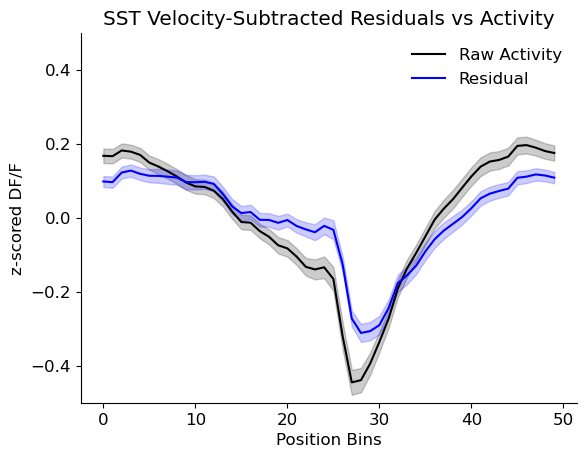

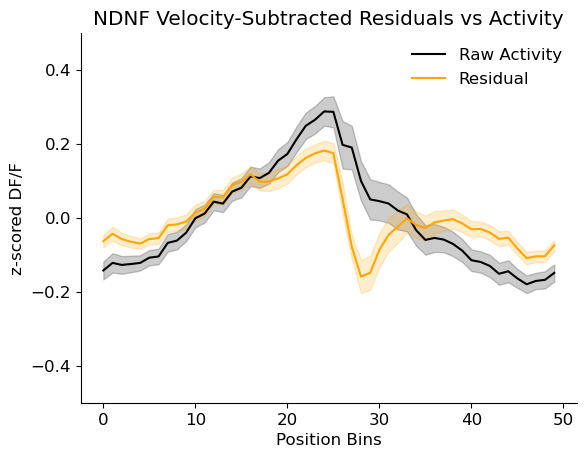

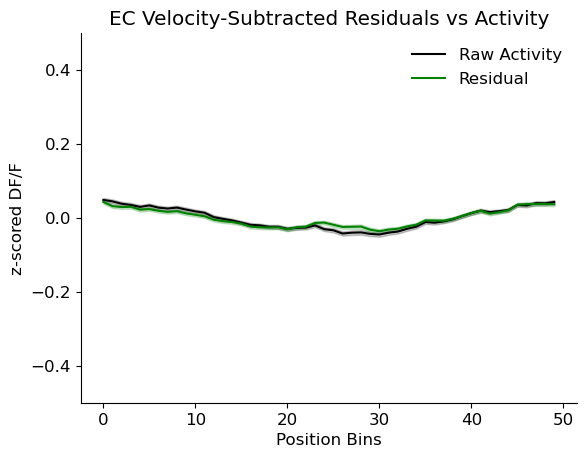

In [6]:
#### Cell and Trial Averaged Velocity-Subtracted Residual vs Raw Data 

plot_cell_trial_average_variable_subtraction(activity_dict_SST, activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_SST, predicted_activity_dict_NDNF, predicted_activity_dict_EC)

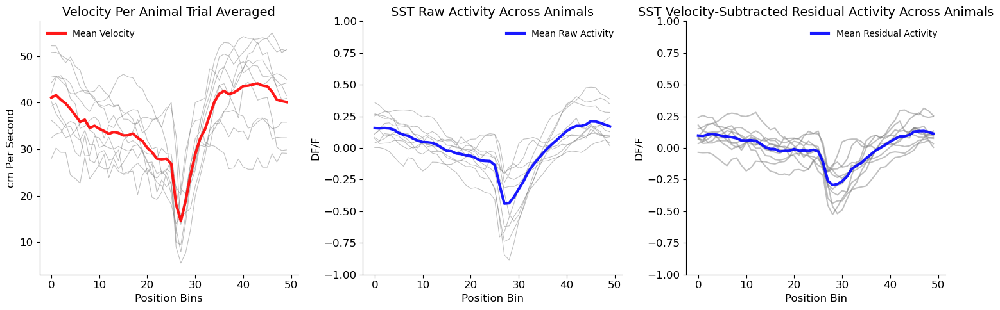

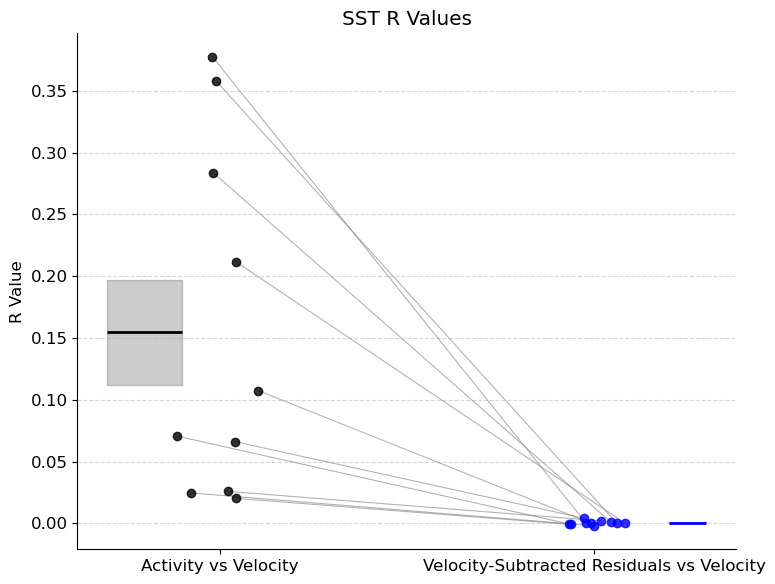

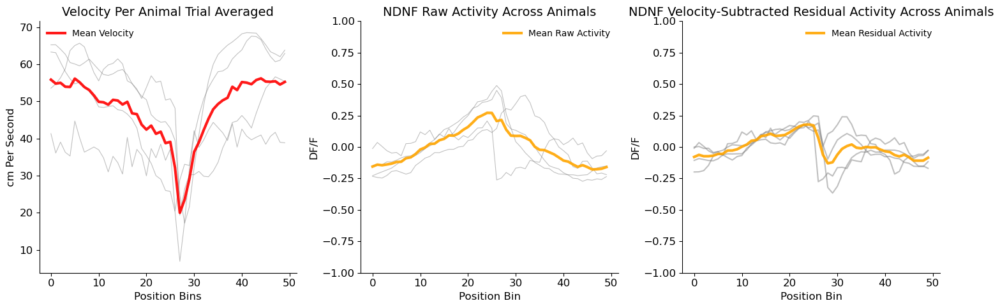

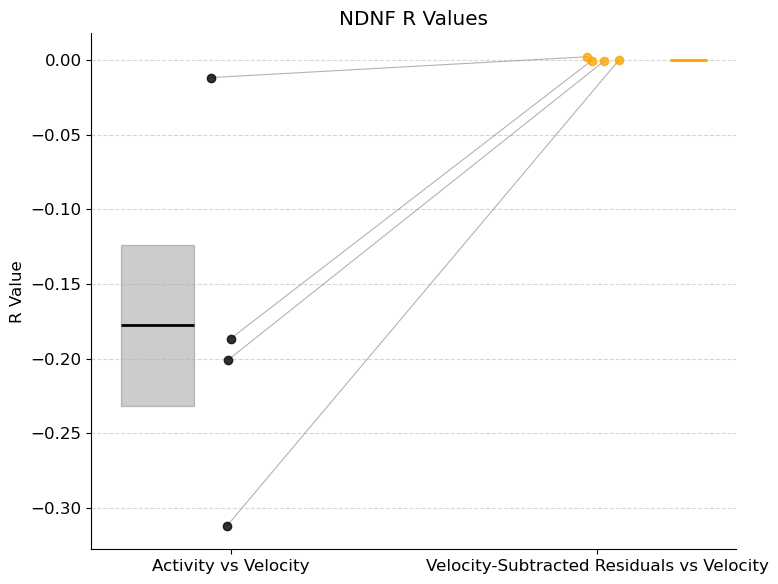

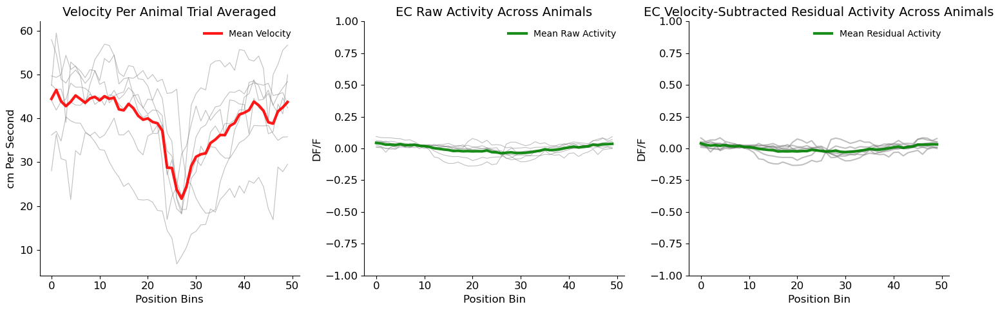

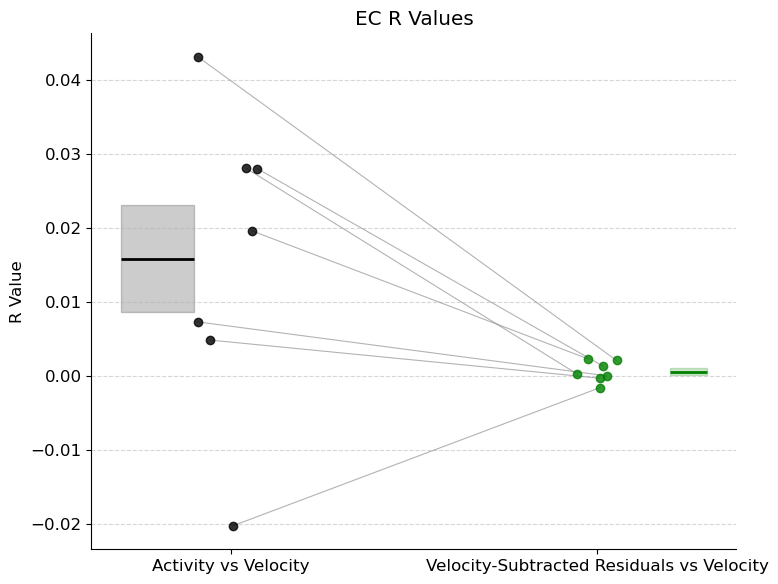

In [7]:
#### 2 per animal velocity, activity and residual

neuron_activity_list_SST, predictions_list_SST, cell_residual_list_SST = get_neuron_activity_prediction_residual(activity_dict_SST, predicted_activity_dict_SST)
animal_mean_list_SST, animal_sem_list_SST, animal_mean_residuals_SST, animal_sem_residuals_SST = get_animal_mean_sem(activity_dict_SST, cell_residual_list_SST) 
plot_single_animal_average_trace(animal_mean_list_SST, animal_mean_residuals_SST, activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, cell_type="SST")

neuron_activity_list_NDNF, predictions_list_NDNF, cell_residual_list_NDNF = get_neuron_activity_prediction_residual(activity_dict_NDNF, predicted_activity_dict_NDNF)
animal_mean_list_NDNF, animal_sem_list_NDNF, animal_mean_residuals_NDNF, animal_sem_residuals_NDNF = get_animal_mean_sem(activity_dict_NDNF, cell_residual_list_NDNF) 
plot_single_animal_average_trace(animal_mean_list_NDNF, animal_mean_residuals_NDNF, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, cell_type="NDNF")

neuron_activity_list_EC, predictions_list_EC, cell_residual_list_EC = get_neuron_activity_prediction_residual(activity_dict_EC, predicted_activity_dict_EC)
animal_mean_list_EC, animal_sem_list_EC, animal_mean_residuals_EC, animal_sem_residuals_EC = get_animal_mean_sem(activity_dict_EC, cell_residual_list_EC) 
plot_single_animal_average_trace(animal_mean_list_EC, animal_mean_residuals_EC, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, cell_type="EC")



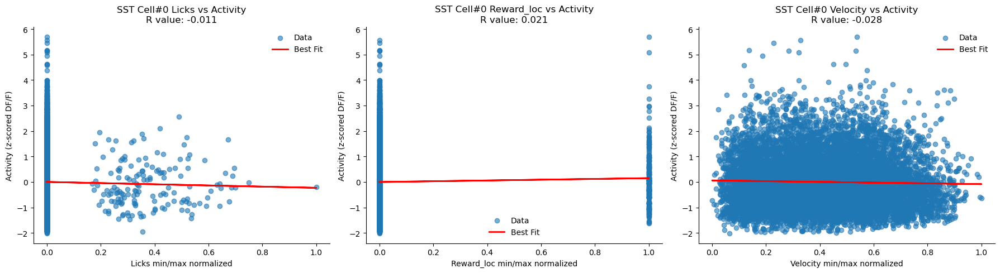

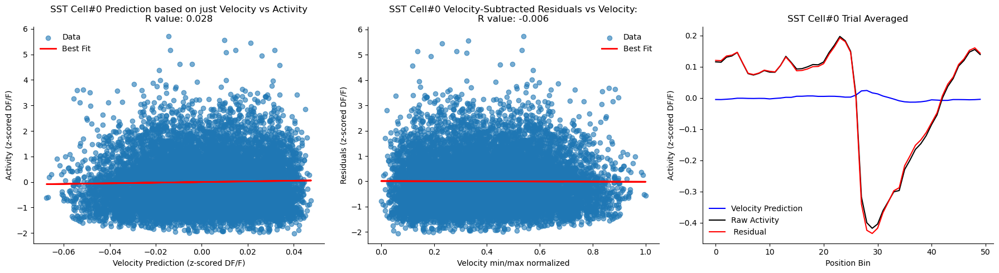

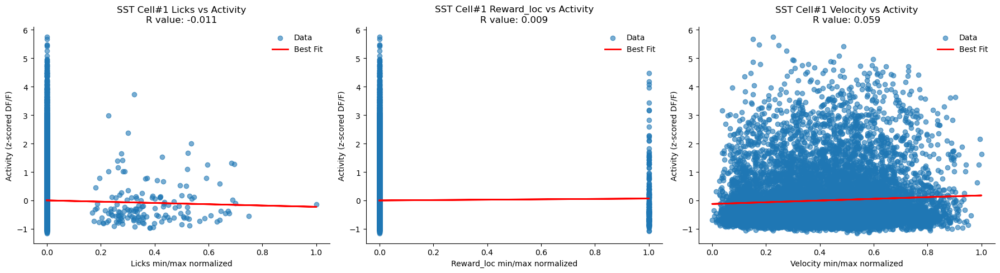

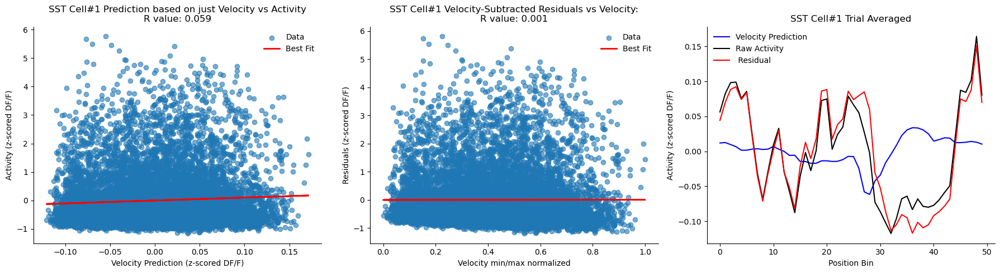

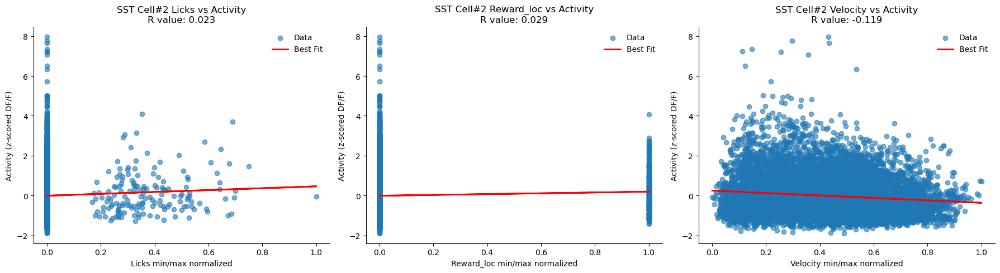

...

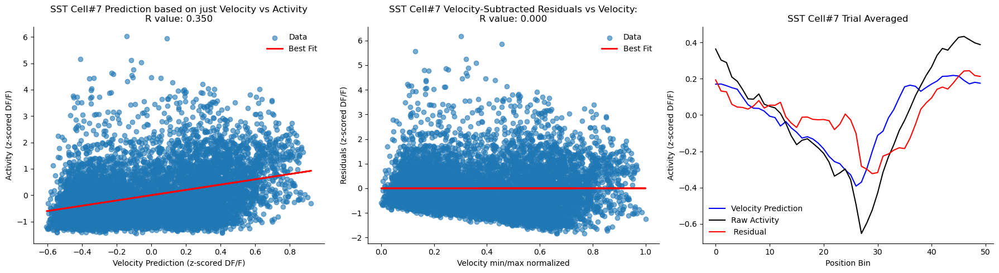

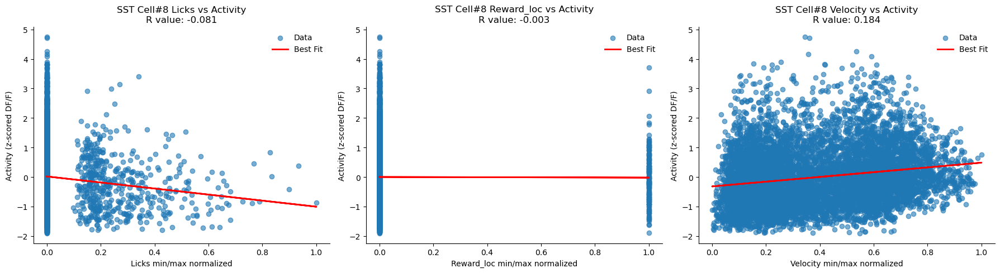

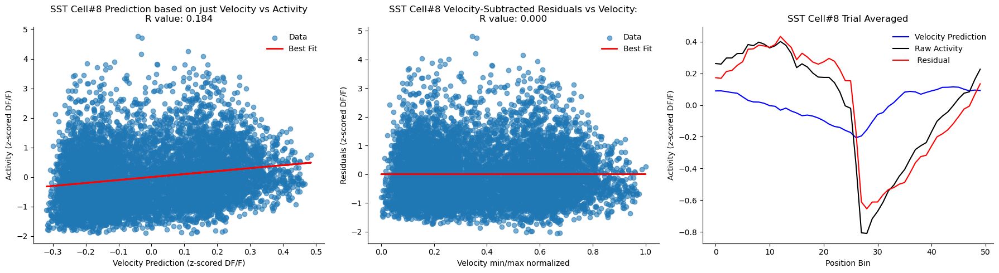

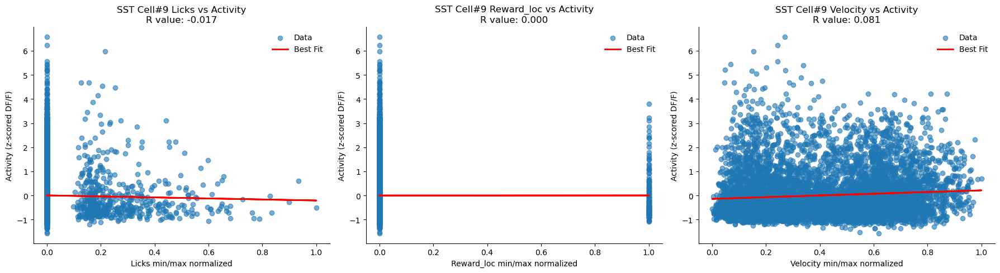

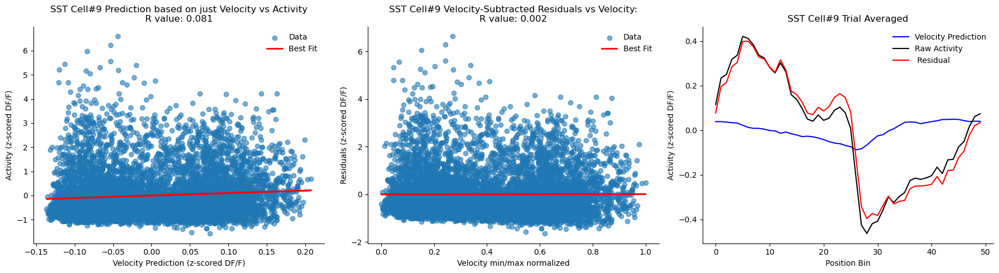

In [116]:
#proof that the velocity-subtracted residuals are less correlated with velocity

for cell_number in range(10):

    plot_correlations_single_variable_GLM(GLM_params_SST, factors_dict_SST, filtered_factors_dict_SST, predicted_activity_dict_SST, activity_dict_SST, cell_number, variable_to_correlate_list=["Licks", "Reward_loc", "Velocity"], variable_into_GLM="Velocity", cell_type="SST")


#     plot_correlations_single_variable_GLM(GLM_params_NDNF, factors_dict_NDNF, filtered_factors_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_NDNF, cell_number, variable_to_correlate_list=["Licks", "Reward_loc", "Velocity"], variable_into_GLM="Velocity", cell_type="NDNF")


    #plot_correlations_single_variable_GLM(GLM_params_EC, factors_dict_EC, filtered_factors_dict_EC, predicted_activity_dict_EC, activity_dict_EC, cell_number, variable_to_correlate_list=["Licks", "Reward_loc", "Velocity"], variable_into_GLM="Velocity", cell_type="EC")


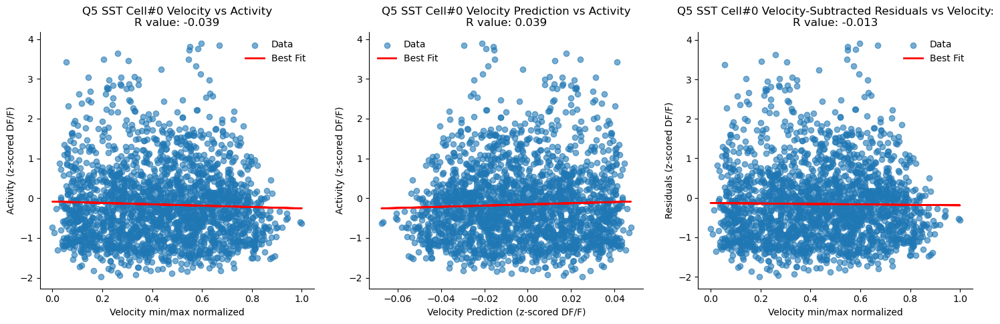

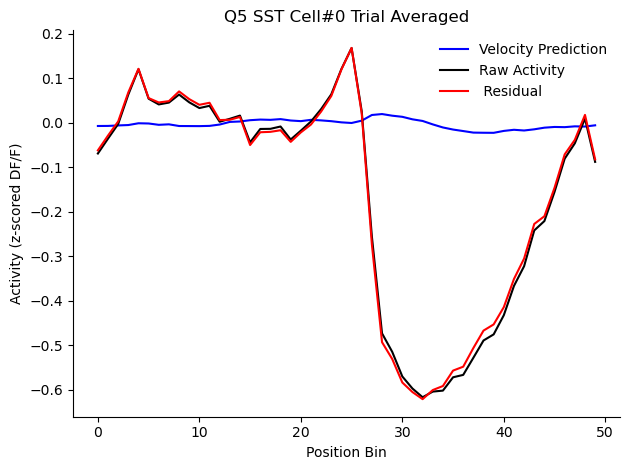

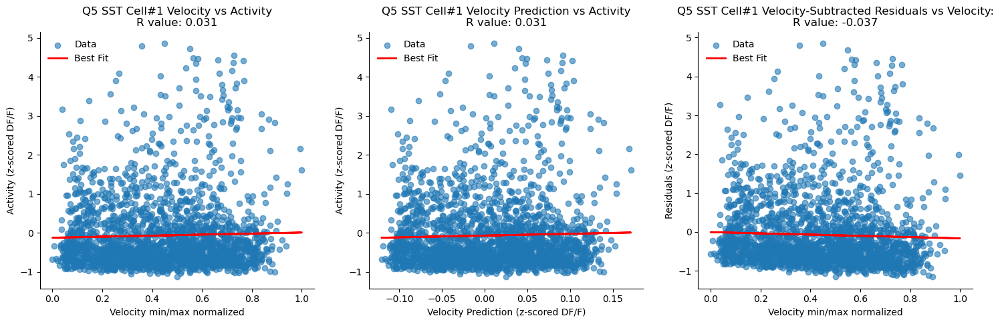

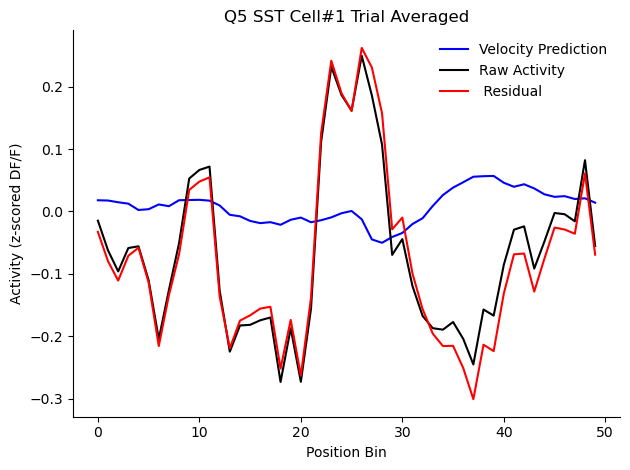

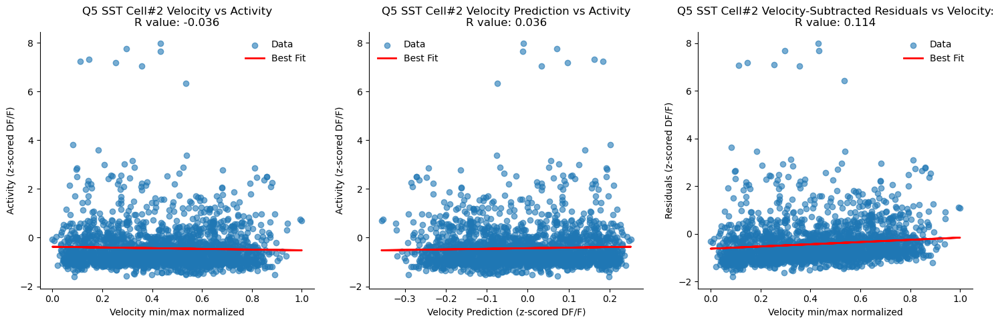

...

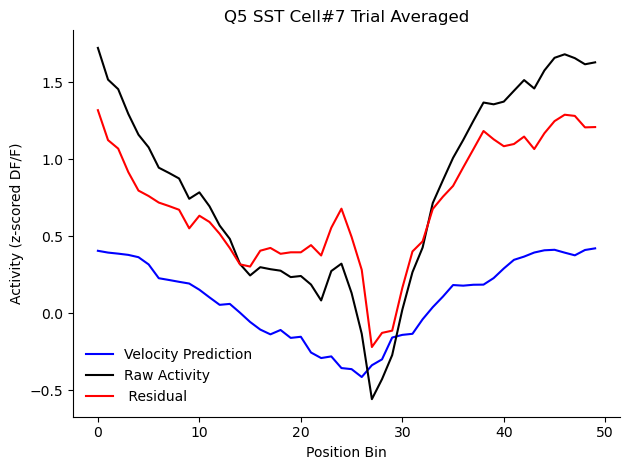

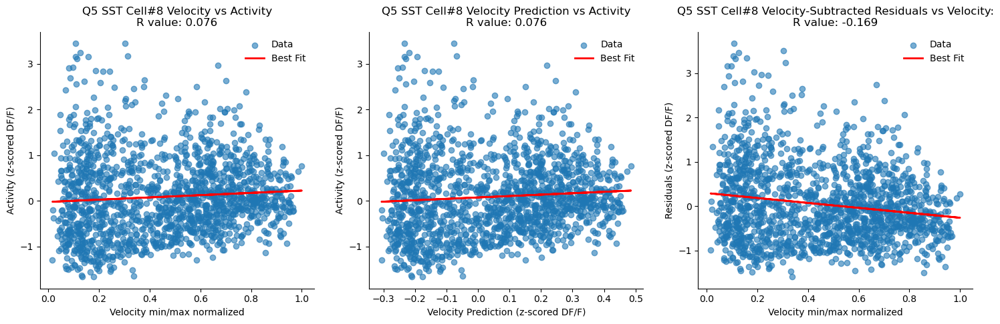

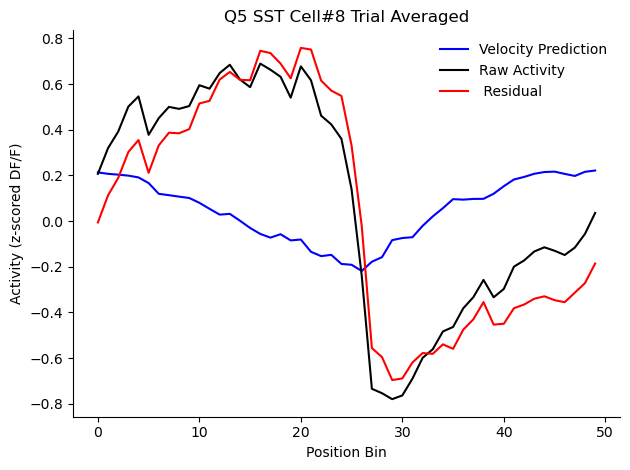

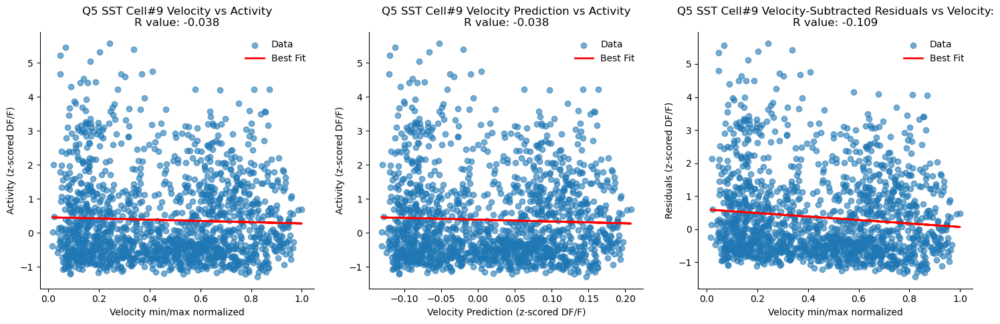

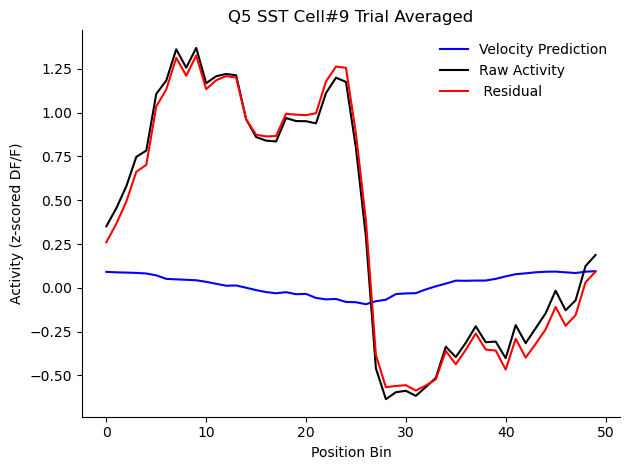

In [117]:

    
for cell in range(10):
#     plot_correlations_single_variable_GLM_quintile(GLM_params_NDNF, factors_dict_NDNF, filtered_factors_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_NDNF, cell_number=cell, variable_to_correlate_list=["Licks", "Reward_loc", "Velocity"], variable_into_GLM="Velocity", cell_type="NDNF", quintile="Q1")

    plot_correlations_single_variable_GLM_quintile(GLM_params_SST, factors_dict_SST, filtered_factors_dict_SST, predicted_activity_dict_SST, activity_dict_SST, cell_number=cell, variable_to_correlate_list=["Licks", "Reward_loc", "Velocity"], variable_into_GLM="Velocity", cell_type="SST", quintile="Q5")


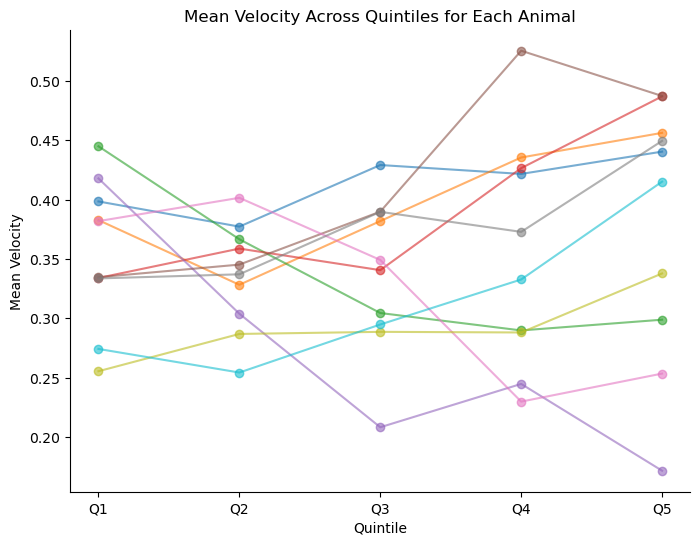

(50,)


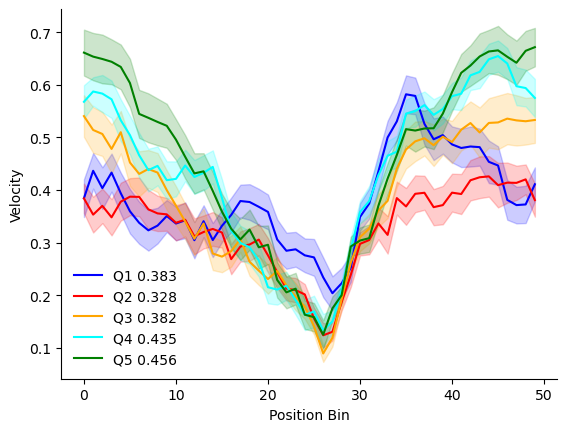

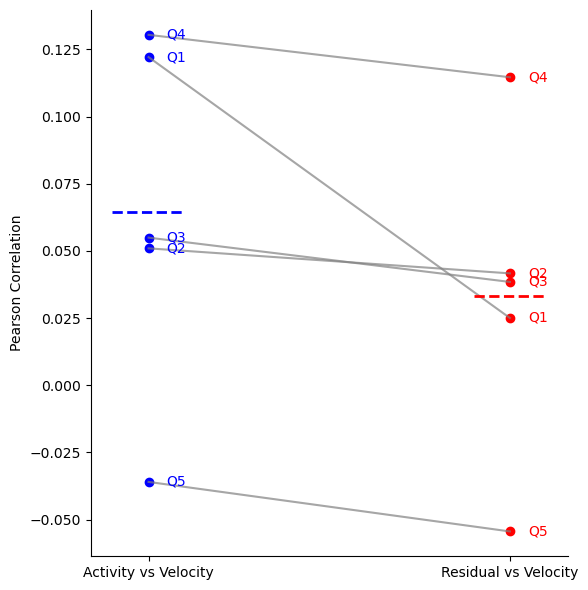

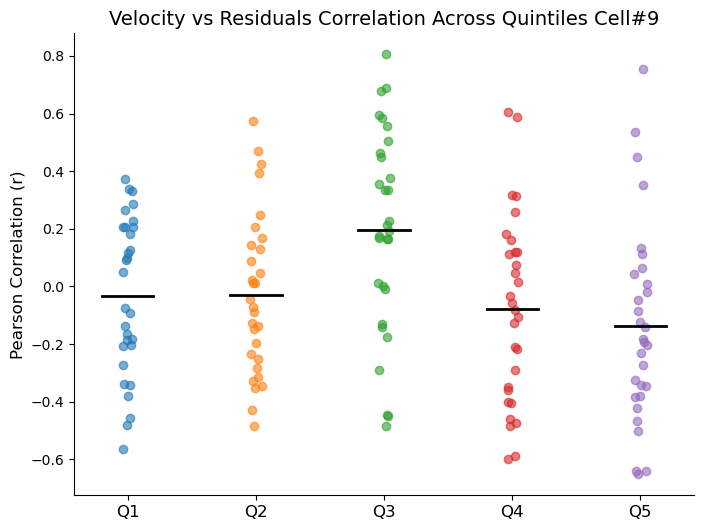

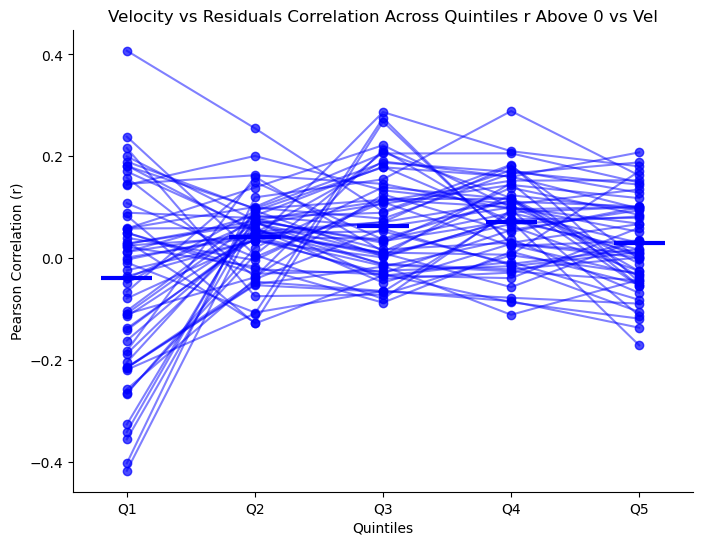

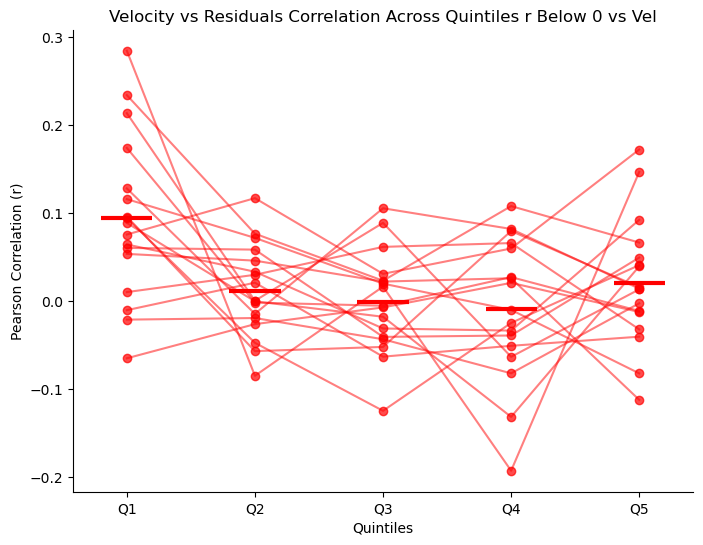

In [29]:
def get_q1_q5_residuals_all_cells(GLM_params, factors_dict, filtered_factors_dict, predicted_activity_dict, activity_dict, variable_into_GLM="Velocity"):
    input_variables = {var: [] for var in factors_dict[next(iter(factors_dict))].keys()}
    filtered_input_variables = {var: [] for var in filtered_factors_dict[next(iter(filtered_factors_dict))].keys()}

    for animal in activity_dict:
        for neuron in activity_dict[animal]:
            for var in factors_dict[animal]:
                input_variables[var].append(factors_dict[animal][var])
            for var in filtered_factors_dict[animal]:
                filtered_input_variables[var].append(filtered_factors_dict[animal][var])

    neuron_activity_list, predictions_list, cell_residual_list = get_neuron_activity_prediction_residual(activity_dict, predicted_activity_dict)
    
    activity_vs_velocity_r_q1 = []
    activity_vs_velocity_r_q2 = []
    activity_vs_velocity_r_q3 = []
    activity_vs_velocity_r_q4 = []
    activity_vs_velocity_r_q5 = []
    
    for cell_number in range(len(neuron_activity_list)):
        cell_activity = neuron_activity_list[cell_number].flatten()
        variable_of_interest = filtered_input_variables[variable_into_GLM][cell_number]
        
    
        q1_activity = sst_quintiles_activity[0].flatten()
        q2_activity = sst_quintiles_activity[1].flatten()
        q3_activity = sst_quintiles_activity[2].flatten()
        q4_activity = sst_quintiles_activity[3].flatten()
        q5_activity = sst_quintiles_activity[4].flatten()
        
        q1_velocity = sst_quintiles_velocity[0].flatten()
        q2_velocity = sst_quintiles_velocity[1].flatten()
        q3_velocity = sst_quintiles_velocity[2].flatten()
        q4_velocity = sst_quintiles_velocity[3].flatten()
        q5_velocity = sst_quintiles_velocity[4].flatten()

        activity_vs_velocity_q1, _ = pearsonr(q1_activity, q1_velocity)
        activity_vs_velocity_q2, _ = pearsonr(q1_activity, q2_velocity)
        activity_vs_velocity_q3, _ = pearsonr(q1_activity, q3_velocity)
        activity_vs_velocity_q4, _ = pearsonr(q1_activity, q4_velocity)
        activity_vs_velocity_q5, _ = pearsonr(q1_activity, q5_velocity)
        

    residual_vs_velocity_r_q1 = []
    residual_vs_velocity_r_q2 = []
    residual_vs_velocity_r_q3 = []
    residual_vs_velocity_r_q4 = []
    residual_vs_velocity_r_q5 = []
    
    for cell_number in range(len(neuron_activity_list)):
        cell_residual = cell_residual_list[cell_number]
        variable_of_interest = filtered_input_variables[variable_into_GLM][cell_number]

        sst_quintiles_residual = split_into_quintiles(cell_residual)
        sst_quintiles_velocity = split_into_quintiles(variable_of_interest)
    
        q1_residual = sst_quintiles_residual[0].flatten()
        q2_residual = sst_quintiles_residual[1].flatten()
        q3_residual = sst_quintiles_residual[2].flatten()
        q4_residual = sst_quintiles_residual[3].flatten()
        q5_residual = sst_quintiles_residual[4].flatten()

        q1_velocity = sst_quintiles_velocity[0].flatten()
        q2_velocity = sst_quintiles_velocity[1].flatten()
        q3_velocity = sst_quintiles_velocity[2].flatten()
        q4_velocity = sst_quintiles_velocity[3].flatten()
        q5_velocity = sst_quintiles_velocity[4].flatten()
        
        residual_vs_velocity_q1, _ = pearsonr(q1_residual, q1_velocity)
        residual_vs_velocity_q2, _ = pearsonr(q1_residual, q2_velocity)
        residual_vs_velocity_q3, _ = pearsonr(q1_residual, q3_velocity)
        residual_vs_velocity_q4, _ = pearsonr(q1_residual, q4_velocity)
        residual_vs_velocity_q5, _ = pearsonr(q1_residual, q5_velocity)
        
        residual_vs_velocity_r_q1.append(residual_vs_velocity_q1)
        residual_vs_velocity_r_q2.append(residual_vs_velocity_q2)
        residual_vs_velocity_r_q3.append(residual_vs_velocity_q3)
        residual_vs_velocity_r_q4.append(residual_vs_velocity_q4)
        residual_vs_velocity_r_q5.append(residual_vs_velocity_q5)
        

    quintile_data = np.array([
        residual_vs_velocity_r_q1,
        residual_vs_velocity_r_q2,
        residual_vs_velocity_r_q3,
        residual_vs_velocity_r_q4,
        residual_vs_velocity_r_q5]).T

    quintile_labels = ["Q1", "Q2", "Q3", "Q4", "Q5"]
    x_positions = np.arange(1, 6)

    plt.figure(figsize=(8, 6))
    for i in range(quintile_data.shape[0]):  
        plt.plot(x_positions, quintile_data[i], 'o', alpha=0.7) 
        plt.plot(x_positions, quintile_data[i], color='gray', alpha=0.5)  

    means = np.mean(quintile_data, axis=0)
    plt.hlines(means, x_positions - 0.2, x_positions + 0.2, color='black', linewidth=3)

    plt.xticks(x_positions, quintile_labels)
    plt.xlabel("Quintiles")
    plt.ylabel("Pearson Correlation (r)")
    plt.title("Velocity vs Residuals Correlation Across Quintiles")
    plt.show()

get_q1_q5_residuals_all_cells(GLM_params_SST, factors_dict_SST, filtered_factors_dict_SST, predicted_activity_dict_SST, activity_dict_SST, variable_into_GLM="Velocity")
    

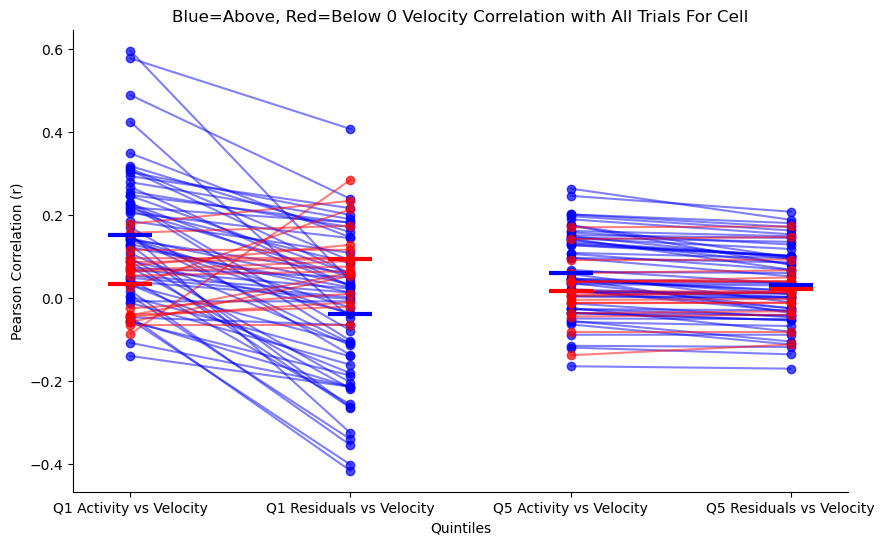

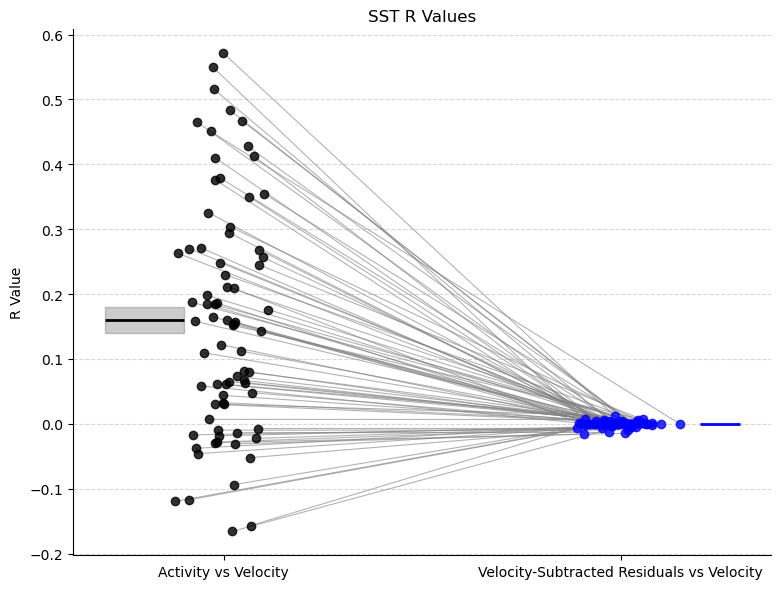

In [43]:
#proof that the velocity-subtracted residuals are less correlated with velocity

r2_variable_activity_dict_SST, r2_variable_residual_dict_SST = get_pop_correlation_to_variable(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, variable_to_correlate="Velocity")


# r2_variable_activity_dict_NDNF, r2_variable_residual_dict_NDNF = get_pop_correlation_to_variable(activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, variable_to_correlate="Velocity")


# r2_variable_activity_dict_EC, r2_variable_residual_dict_EC = get_pop_correlation_to_variable(activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, variable_to_correlate="Velocity")


plot_pop_correlation(r2_variable_activity_dict_SST, r2_variable_residual_dict_SST, variable_to_correlate="Velocity", cell_type="SST", color="blue", dictionary=True)


# plot_pop_correlation(r2_variable_activity_dict_NDNF, r2_variable_residual_dict_NDNF, variable_to_correlate="Velocity", cell_type="NDNF", color="orange", dictionary=True)


# plot_pop_correlation(r2_variable_activity_dict_EC, r2_variable_residual_dict_EC, variable_to_correlate="Velocity", cell_type="EC", color="green", dictionary=True)


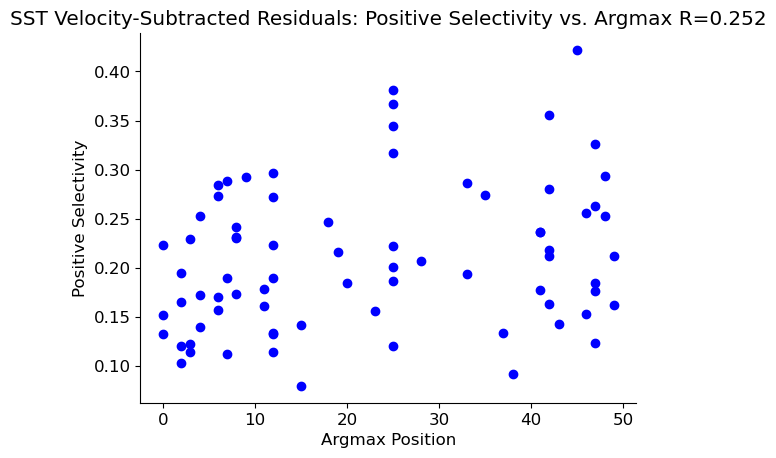

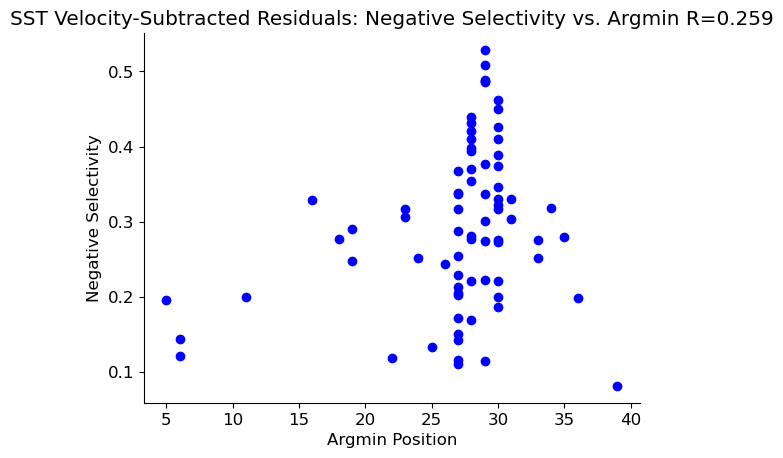

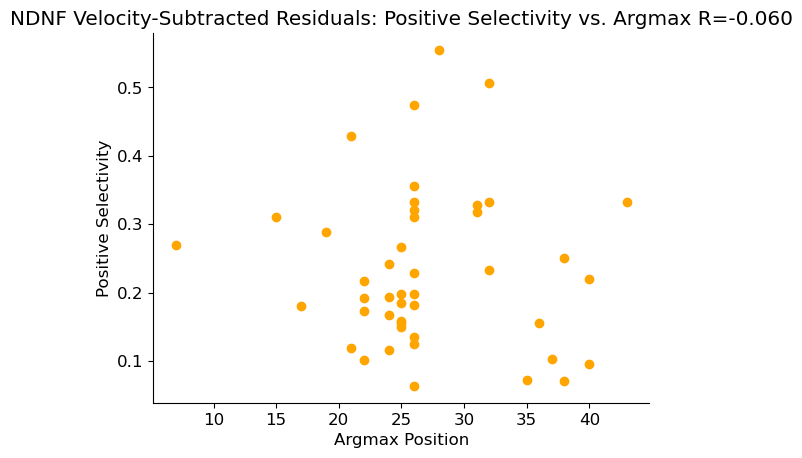

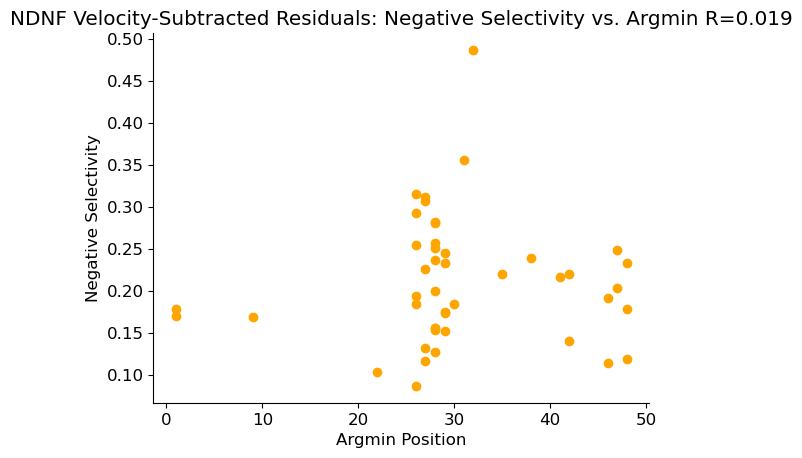

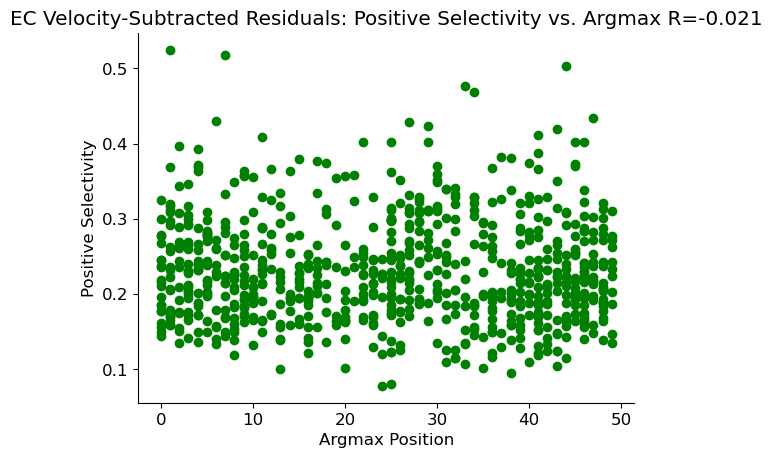

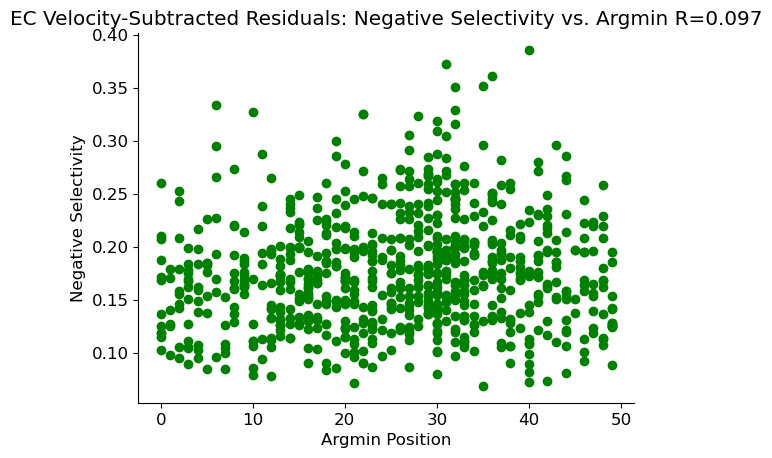

In [10]:

plot_selectivity_vs_peak(activity_dict_SST, predicted_activity_dict_SST, residual=True, cell_type="SST")
plot_selectivity_vs_peak(activity_dict_NDNF, predicted_activity_dict_NDNF, residual=True, cell_type="NDNF")
plot_selectivity_vs_peak(activity_dict_EC, predicted_activity_dict_EC, residual=True, cell_type="EC")
    

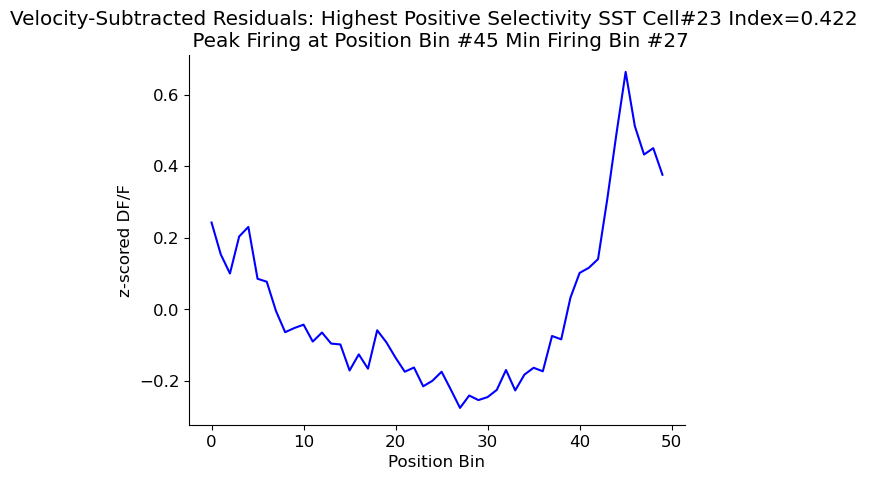

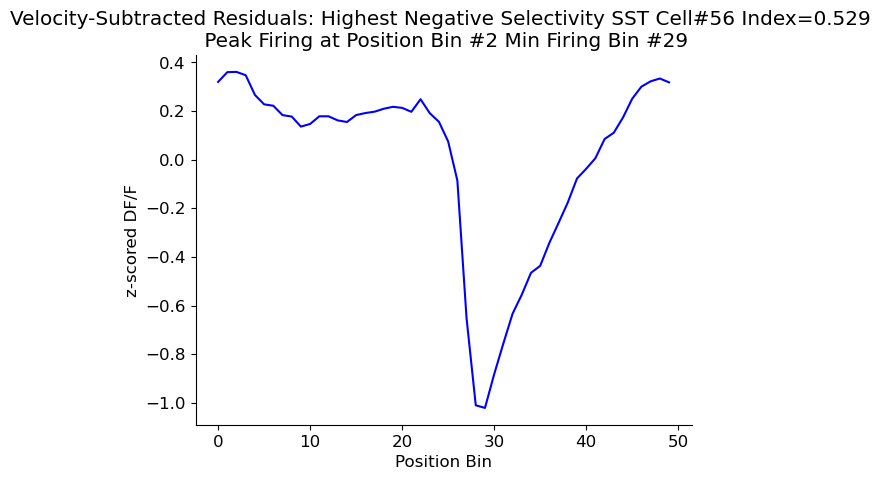

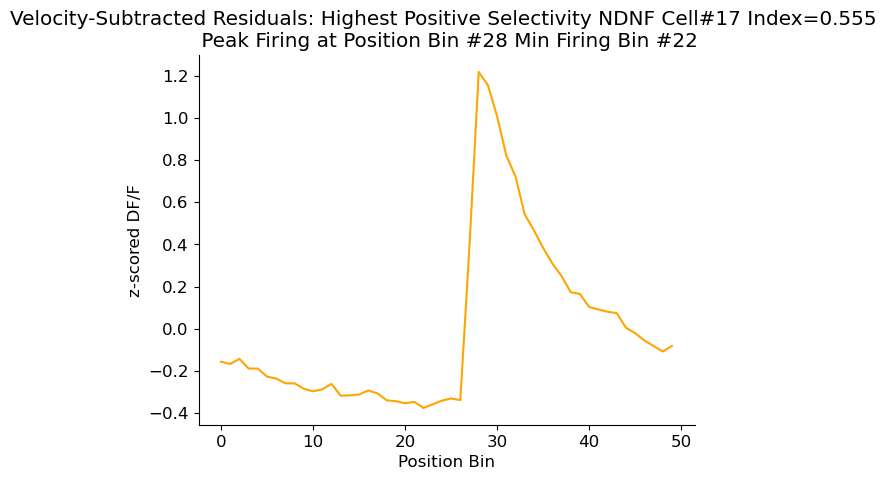

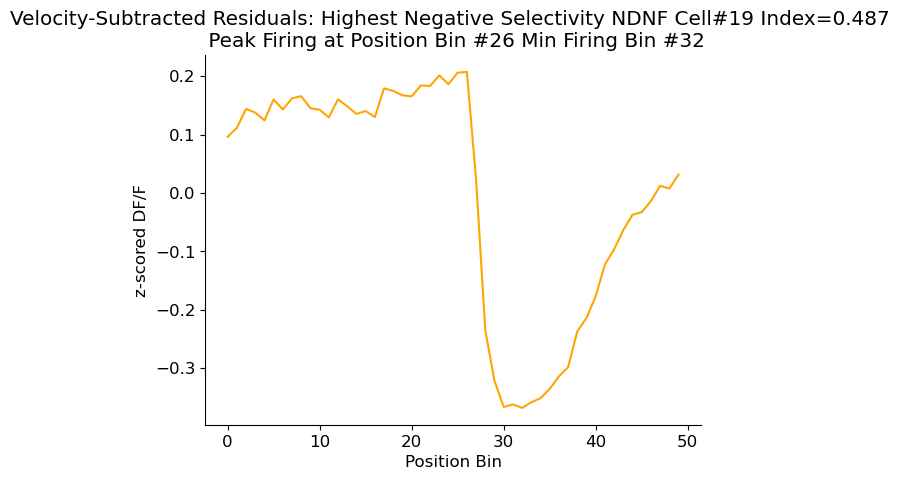

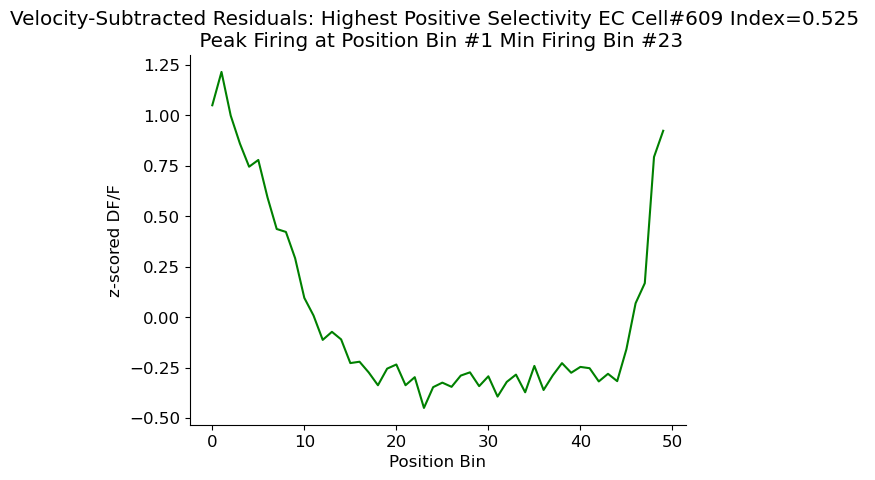

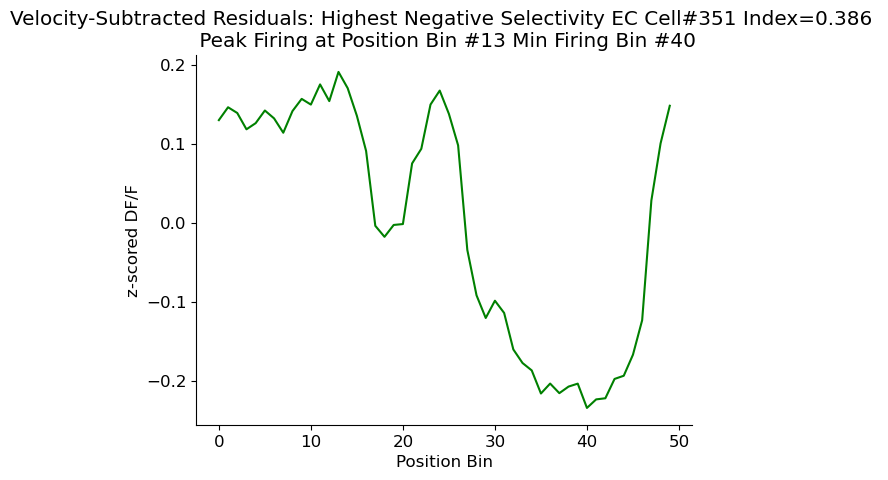

In [11]:

    
plot_highest_positive_negative_selectivity(activity_dict_SST, predicted_activity_dict_SST, residual=True, cell_type="SST")
plot_highest_positive_negative_selectivity(activity_dict_NDNF, predicted_activity_dict_NDNF, residual=True, cell_type="NDNF")
plot_highest_positive_negative_selectivity(activity_dict_EC, predicted_activity_dict_EC, residual=True, cell_type="EC")
    

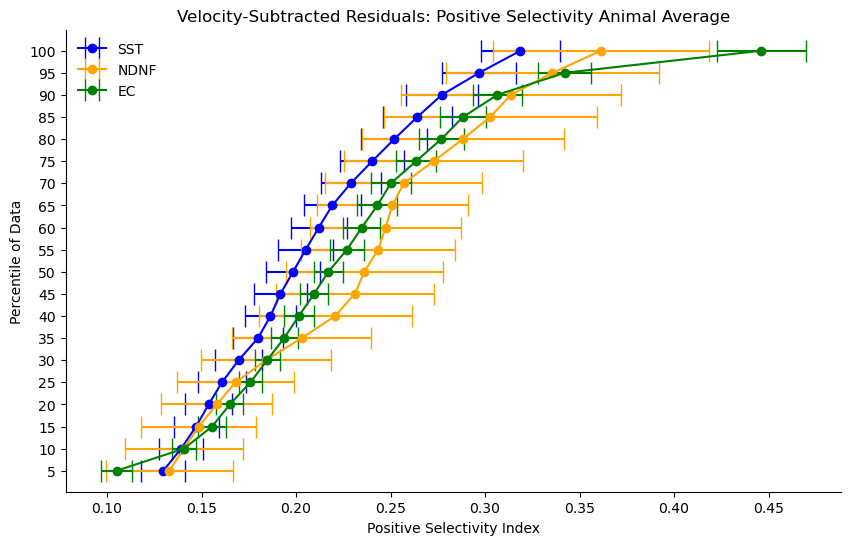

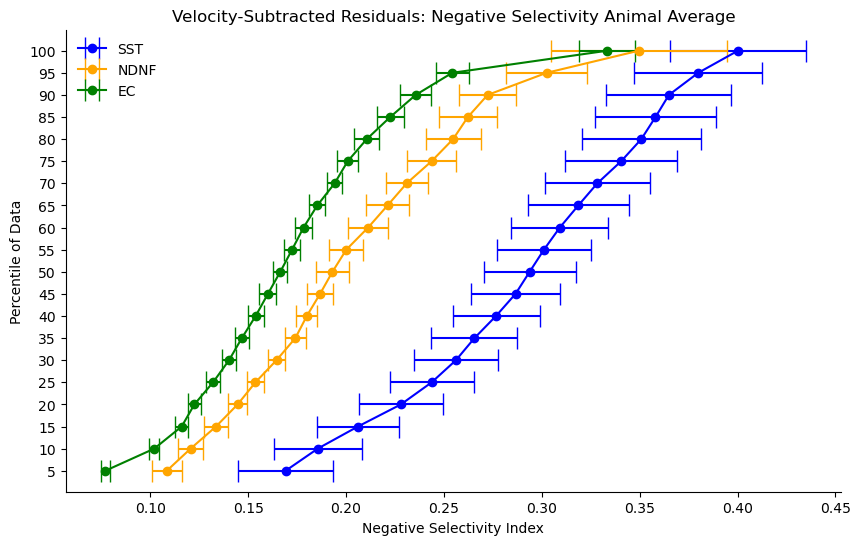

In [26]:
# #selectivity for raw data 

# mean_quantiles_list, sem_quantiles_list, mean_quantiles_list_negative, sem_quantiles_list_negative = setup_CDF_plotting_for_selectivity(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=True)

# plot_cdf(mean_quantiles_list, sem_quantiles_list, title="Positive Selectivity", x_title="Selectivity Index", n_bins=20, residual=False)

# plot_cdf(mean_quantiles_list_negative, sem_quantiles_list_negative, title="Negative Selectivity", x_title="Selectivity Index", n_bins=20, residual=False)




#selectivity for residuals

mean_quantiles_list, sem_quantiles_list, mean_quantiles_list_negative, sem_quantiles_list_negative = setup_CDF_plotting_for_selectivity(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=True)

plot_cdf(mean_quantiles_list, sem_quantiles_list, pos_neg_selectivity_max_or_min="pos", n_bins=20, residual=True)

plot_cdf(mean_quantiles_list_negative, sem_quantiles_list_negative, pos_neg_selectivity_max_or_min="neg", n_bins=20, residual=True)


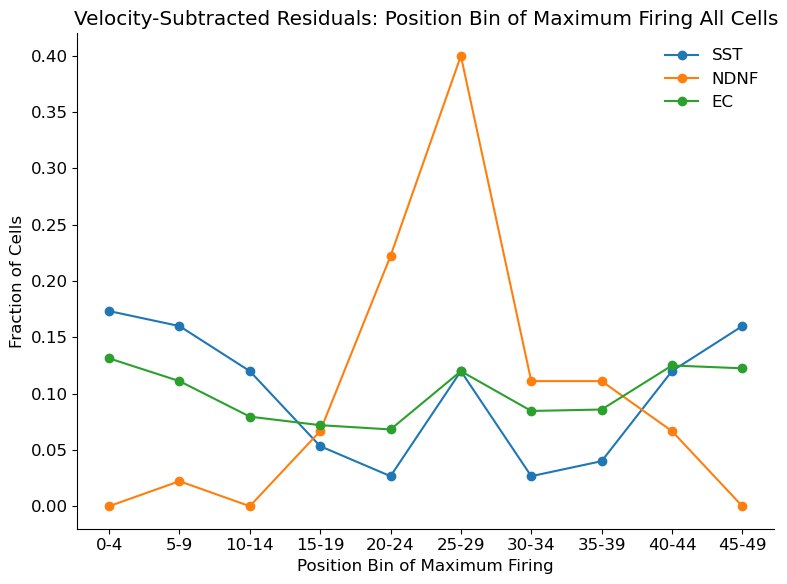

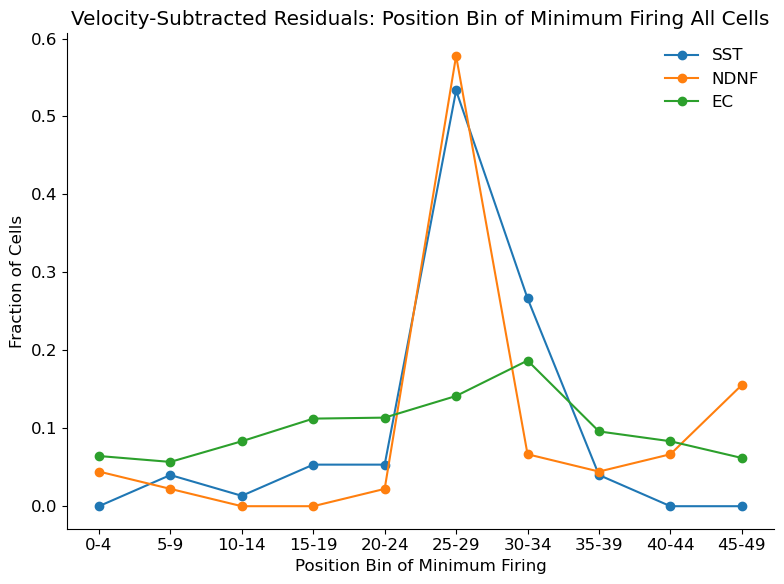

In [13]:
#### Raw
# SST_argmax_list, NDNF_argmax_list, EC_argmax_list = split_argmin_argmax(activity_dict_SST, predicted_activity_dict_SST, 
#                               activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=False, which_to_plot="argmax")
# SST_argmin_list, NDNF_argmin_list, EC_argmin_list = split_argmin_argmax(activity_dict_SST, predicted_activity_dict_SST, 
#                               activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=False, which_to_plot="argmin")

# plot_frequency_dist(SST_argmax_list, NDNF_argmax_list, EC_argmax_list, name="Argmax", selectivity_or_arg="arg", residual=False)
# plot_frequency_dist(SST_argmin_list, NDNF_argmin_list, EC_argmin_list, name="Argmin", selectivity_or_arg="arg", residual=False)



#### Residuals 

SST_argmax_list, NDNF_argmax_list, EC_argmax_list = split_argmin_argmax(activity_dict_SST, predicted_activity_dict_SST, 
                              activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=True, which_to_plot="argmax")
SST_argmin_list, NDNF_argmin_list, EC_argmin_list = split_argmin_argmax(activity_dict_SST, predicted_activity_dict_SST, 
                              activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=True, which_to_plot="argmin")

plot_frequency_dist(SST_argmax_list, NDNF_argmax_list, EC_argmax_list, pos_neg_selectivity_max_or_min="max", residual=True)
plot_frequency_dist(SST_argmin_list, NDNF_argmin_list, EC_argmin_list, pos_neg_selectivity_max_or_min="min", residual=True)


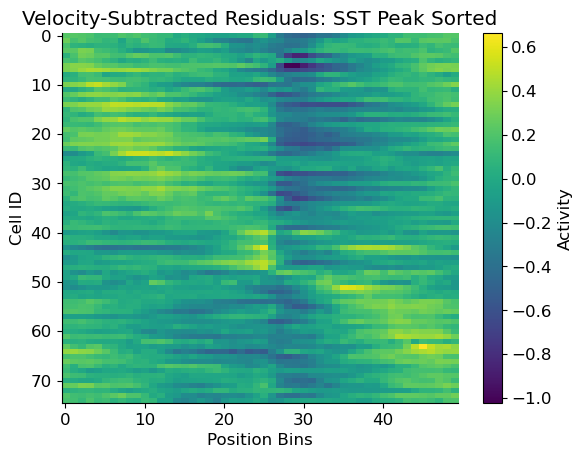

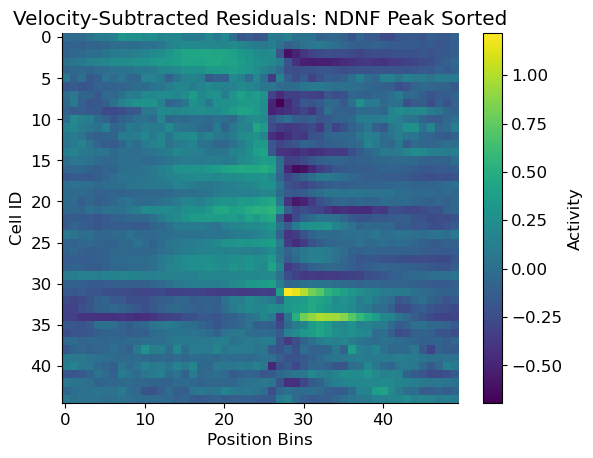

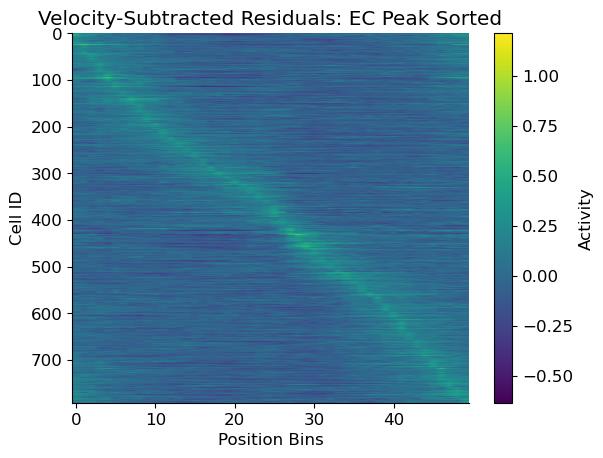

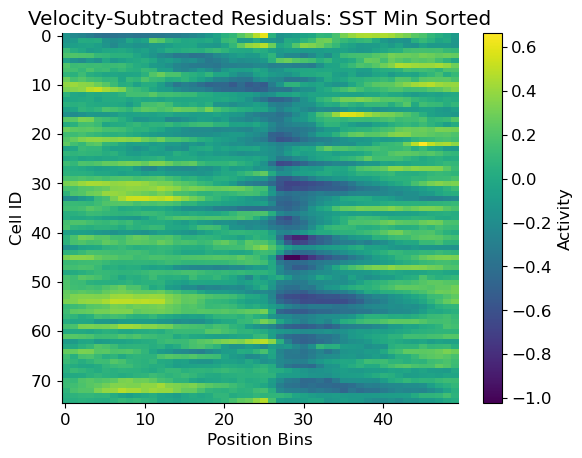

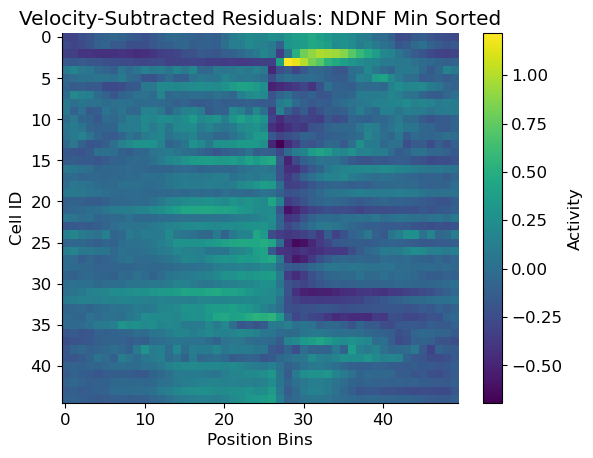

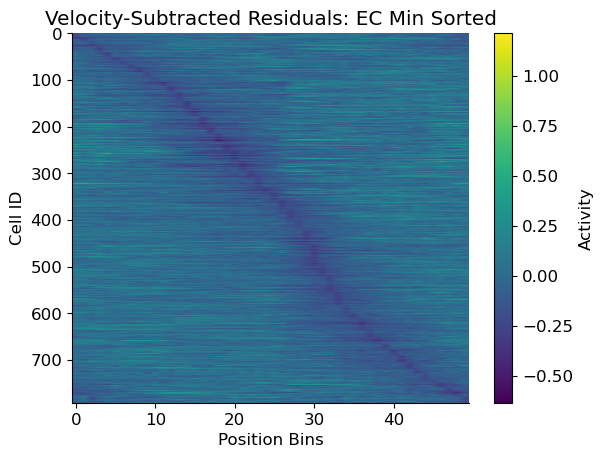

In [14]:
# ### Raw
    
# plot_trial_averages(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=False, which_to_plot="argmax")

# plot_trial_averages(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=False, which_to_plot="argmin")


#### Residuuals
plot_trial_averages(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=True, which_to_plot="argmax")

plot_trial_averages(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=True, which_to_plot="argmin")

    


In [15]:
########## splitting data by velocity correlation: split data into 2 groups - r value vs velocity 
# either above or below zero

In [16]:
##### split_cdf

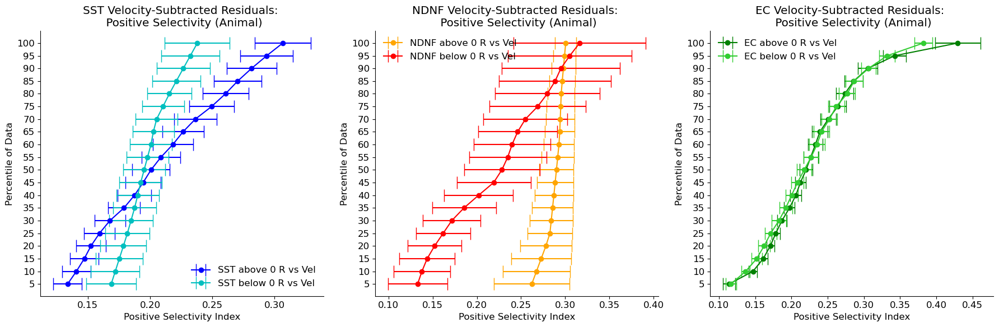

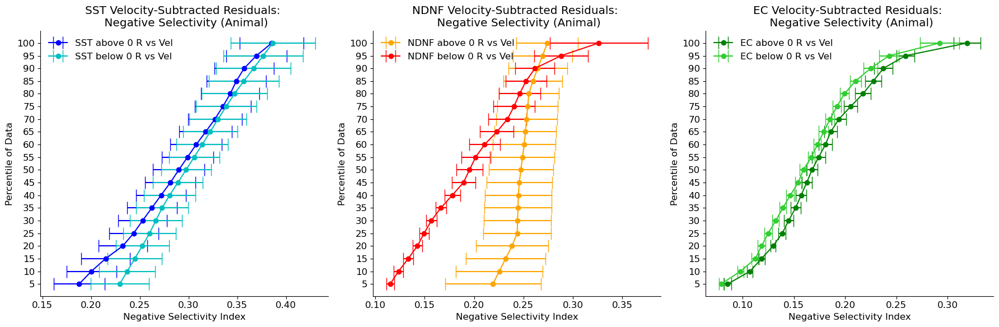

In [17]:
#selectivity metrics by velocity correlation 

# ##### Raw

# mean_quantiles_list, sem_quantiles_list = setup_CDF_plotting_split_by_r2(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, residual=False, compute_negative=False)

# mean_quantiles_list_negative, sem_quantiles_list_negative = setup_CDF_plotting_split_by_r2(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, residual=False, compute_negative=False)

# plot_cdf_split_r2(mean_quantiles_list, sem_quantiles_list, "Selectivity", "Vinje Selectivity Index", n_bins=20, residual=False)
# plot_cdf_split_r2(mean_quantiles_list_negative, sem_quantiles_list_negative, "Negative Selectivity", "Negative Vinje Selectivity Index", n_bins=20, residual=False)



##### Velocity-Subtracted Residuals
mean_quantiles_list, sem_quantiles_list = setup_CDF_plotting_split_by_r2(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, residual=True, compute_negative=False)
mean_quantiles_list_negative, sem_quantiles_list_negative = setup_CDF_plotting_split_by_r2(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, residual=True, compute_negative=True)


plot_cdf_split_r_or_learn(mean_quantiles_list, sem_quantiles_list, pos_neg_selectivity_max_or_min="pos", n_bins=20, residual=True, r_or_learn="r")
plot_cdf_split_r_or_learn(mean_quantiles_list_negative, sem_quantiles_list_negative, pos_neg_selectivity_max_or_min="neg", n_bins=20, residual=True, r_or_learn="r")


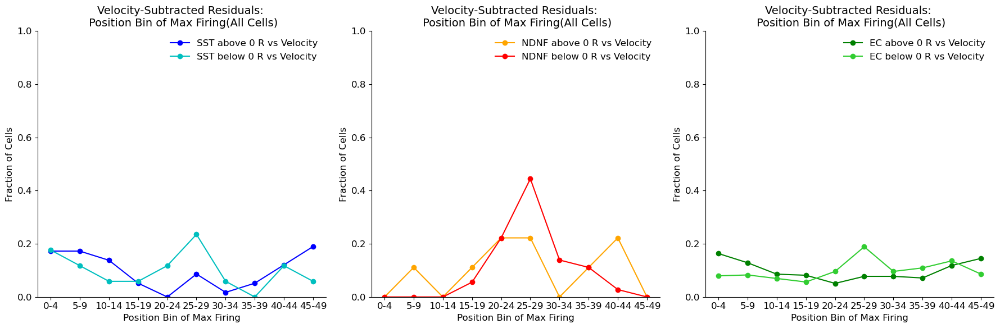

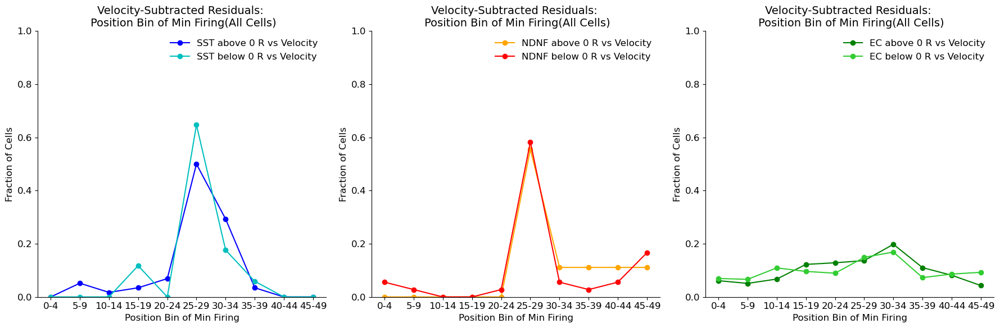

In [18]:
# #### Raw 

# r2_SST_above_zero, r2_SST_below_zero = get_r2_above_and_below_zero(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST,
#                                 variable_to_correlate="Velocity")
    
# r2_NDNF_above_zero, r2_NDNF_below_zero = get_r2_above_and_below_zero(activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF,
#                                 variable_to_correlate="Velocity")
    
# r2_EC_above_zero, r2_EC_below_zero = get_r2_above_and_below_zero(activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC,
#                                 variable_to_correlate="Velocity")



# SST_above_zero_argmax, SST_below_zero_argmax, NDNF_above_zero_argmax, NDNF_below_zero_argmax, EC_above_zero_argmax, EC_below_zero_argmax = split_argmin_argmax_by_r2(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, r2_SST_above_zero, r2_SST_below_zero, r2_NDNF_above_zero, r2_NDNF_below_zero, r2_EC_above_zero, r2_EC_below_zero, residual=True, which_to_plot="argmax")


# SST_above_zero_argmin, SST_below_zero_argmin, NDNF_above_zero_argmin, NDNF_below_zero_argmin, EC_above_zero_argmin, EC_below_zero_argmin = split_argmin_argmax_by_r2(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, r2_SST_above_zero, r2_SST_below_zero, r2_NDNF_above_zero, r2_NDNF_below_zero, r2_EC_above_zero, r2_EC_below_zero, residual=True, which_to_plot="argmin")


# plot_frequency_hist_seperate(SST_above_zero_argmax, SST_below_zero_argmax, NDNF_above_zero_argmax, NDNF_below_zero_argmax, EC_above_zero_argmax, EC_below_zero_argmax, selectivity_or_arg="arg", name="Argmax", residual=True, r_or_learn="r")

# plot_frequency_hist_seperate(SST_above_zero_argmin, SST_below_zero_argmin, NDNF_above_zero_argmin, NDNF_below_zero_argmin, EC_above_zero_argmin, EC_below_zero_argmin, selectivity_or_arg="arg", name="Argmin", residual=True, r_or_learn="r")






#### Residuals 

r2_SST_above_zero, r2_SST_below_zero = get_r2_above_and_below_zero(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST,
                                variable_to_correlate="Velocity")
    
r2_NDNF_above_zero, r2_NDNF_below_zero = get_r2_above_and_below_zero(activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF,
                                variable_to_correlate="Velocity")
    
r2_EC_above_zero, r2_EC_below_zero = get_r2_above_and_below_zero(activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC,
                                variable_to_correlate="Velocity")



SST_above_zero_argmax, SST_below_zero_argmax, NDNF_above_zero_argmax, NDNF_below_zero_argmax, EC_above_zero_argmax, EC_below_zero_argmax = split_argmin_argmax_by_r2(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, r2_SST_above_zero, r2_SST_below_zero, r2_NDNF_above_zero, r2_NDNF_below_zero, r2_EC_above_zero, r2_EC_below_zero, residual=True, which_to_plot="argmax")


SST_above_zero_argmin, SST_below_zero_argmin, NDNF_above_zero_argmin, NDNF_below_zero_argmin, EC_above_zero_argmin, EC_below_zero_argmin = split_argmin_argmax_by_r2(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, r2_SST_above_zero, r2_SST_below_zero, r2_NDNF_above_zero, r2_NDNF_below_zero, r2_EC_above_zero, r2_EC_below_zero, residual=True, which_to_plot="argmin")

plot_frequency_hist_seperate(SST_above_zero_argmax, SST_below_zero_argmax, NDNF_above_zero_argmax, NDNF_below_zero_argmax, EC_above_zero_argmax, EC_below_zero_argmax, pos_neg_selectivity_max_or_min="max", residual=True, r_or_learn="r")

plot_frequency_hist_seperate(SST_above_zero_argmin, SST_below_zero_argmin, NDNF_above_zero_argmin, NDNF_below_zero_argmin, EC_above_zero_argmin, EC_below_zero_argmin, pos_neg_selectivity_max_or_min="min", residual=True, r_or_learn="r")



In [19]:
############################## Learning --- Quintile 1 of Trials vs Quintile 5 ###############################

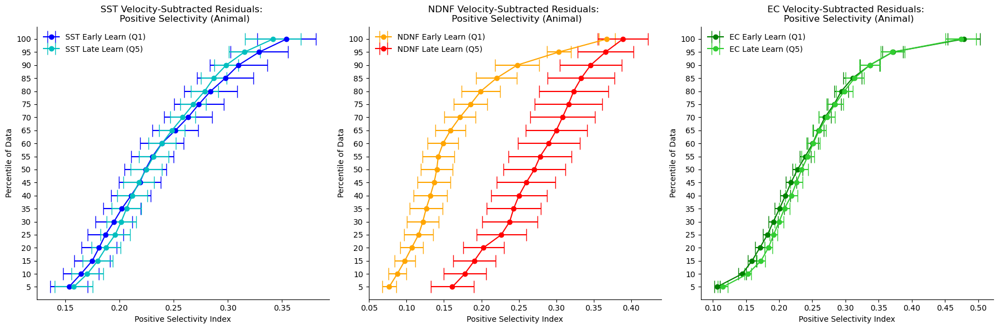

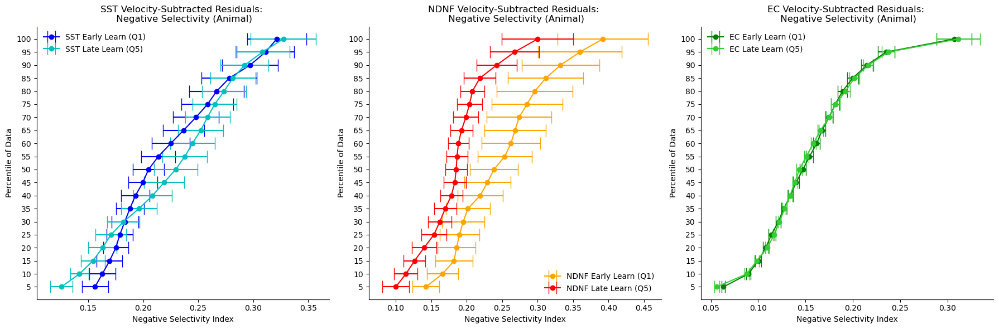

In [20]:


positive_mean_list, positive_sem_list, negative_mean_list, negative_sem_list = plot_positive_negative_selectivity_by_quintile(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF,
                                                   predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC)

plot_cdf_split_r_or_learn(positive_mean_list, positive_sem_list, pos_neg_selectivity_max_or_min="pos", n_bins=20, r_or_learn="learn")
plot_cdf_split_r_or_learn(negative_mean_list, negative_sem_list, pos_neg_selectivity_max_or_min="neg", n_bins=20, r_or_learn="learn")


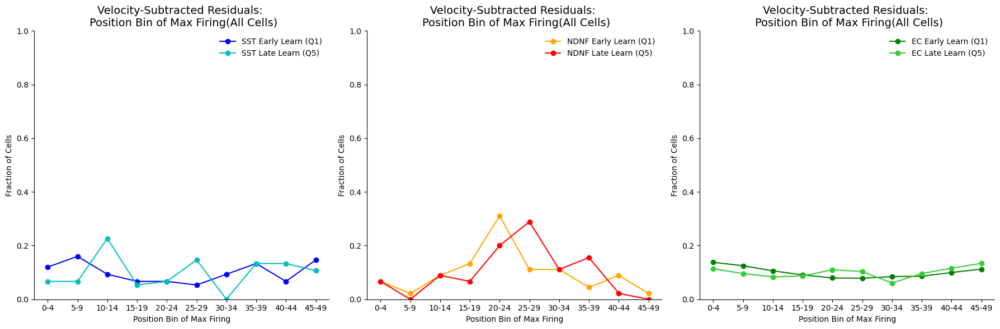

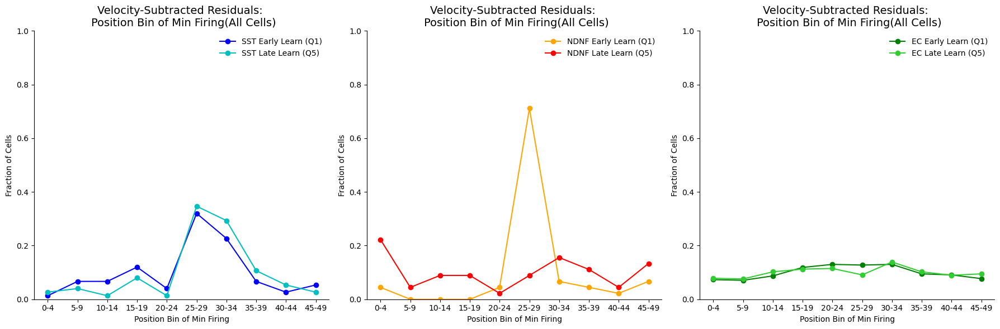

In [21]:

argmax_SST_q1, argmax_SST_q5, argmax_NDNF_q1, argmax_NDNF_q5, argmax_EC_q1, argmax_EC_q5 = get_argmin_argmax_split_learning_histogram(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF,
                                     predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, argmax_or_argmin="argmax")
    
argmin_SST_q1, argmin_SST_q5, argmin_NDNF_q1, argmin_NDNF_q5, argmin_EC_q1, argmin_EC_q5 = get_argmin_argmax_split_learning_histogram(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF,
                                     predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, argmax_or_argmin="argmin")


plot_frequency_hist_seperate(argmax_SST_q1, argmax_SST_q5, argmax_NDNF_q1, argmax_NDNF_q5, argmax_EC_q1, argmax_EC_q5, pos_neg_selectivity_max_or_min='max', residual=True, r_or_learn="learn")
plot_frequency_hist_seperate(argmin_SST_q1, argmin_SST_q5, argmin_NDNF_q1, argmin_NDNF_q5, argmin_EC_q1, argmin_EC_q5, pos_neg_selectivity_max_or_min='min', residual=True, r_or_learn="learn")


activity_SST_above[1].shape (50, 212)
correlation_above_list_all_trials 58
correlation_below_list_all_trials 17
correlation_above_list_q1 58
correlation_below_list_q1 17
correlation_above_list_q5 58
correlation_below_list_q5 17


<Figure size 1000x600 with 0 Axes>

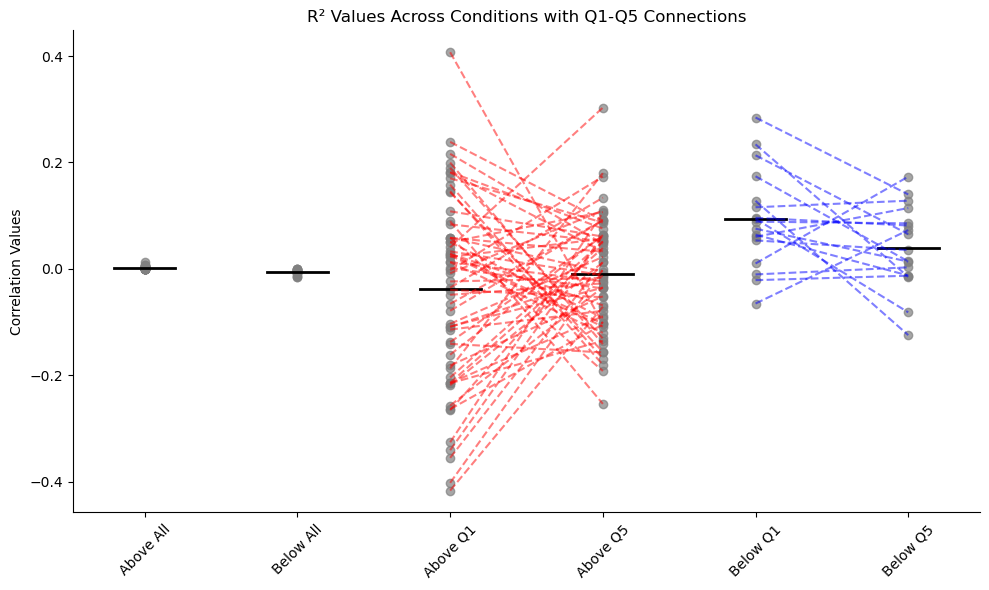

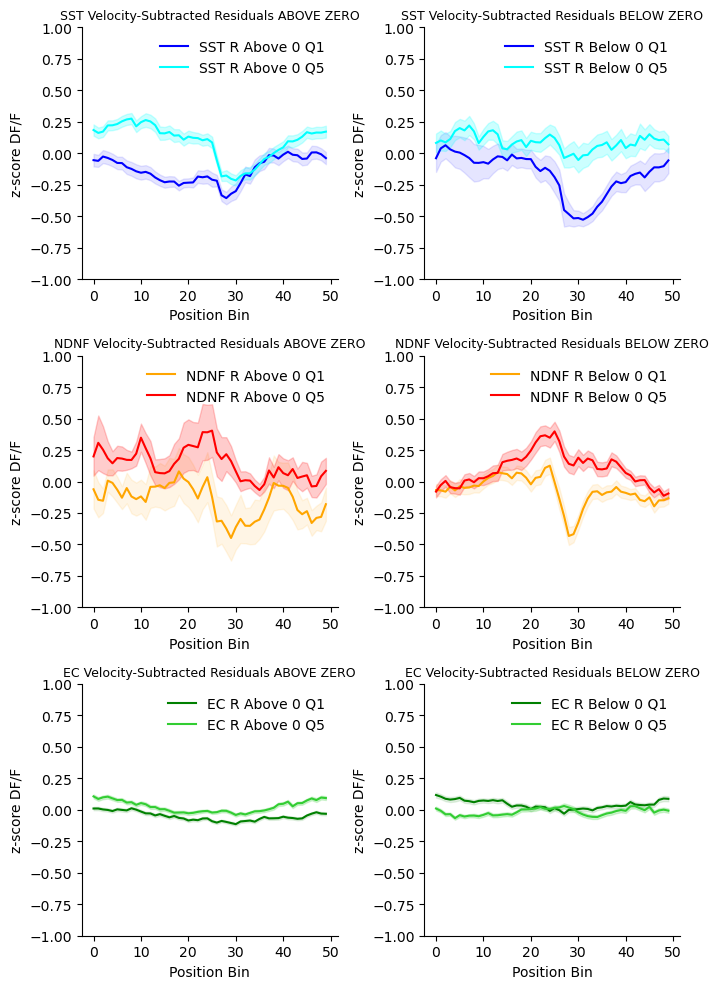

In [193]:

    
plot_r2_above_below_per_animal_with_learning(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, residual=True)


len(r2_SST_above_zero) 10


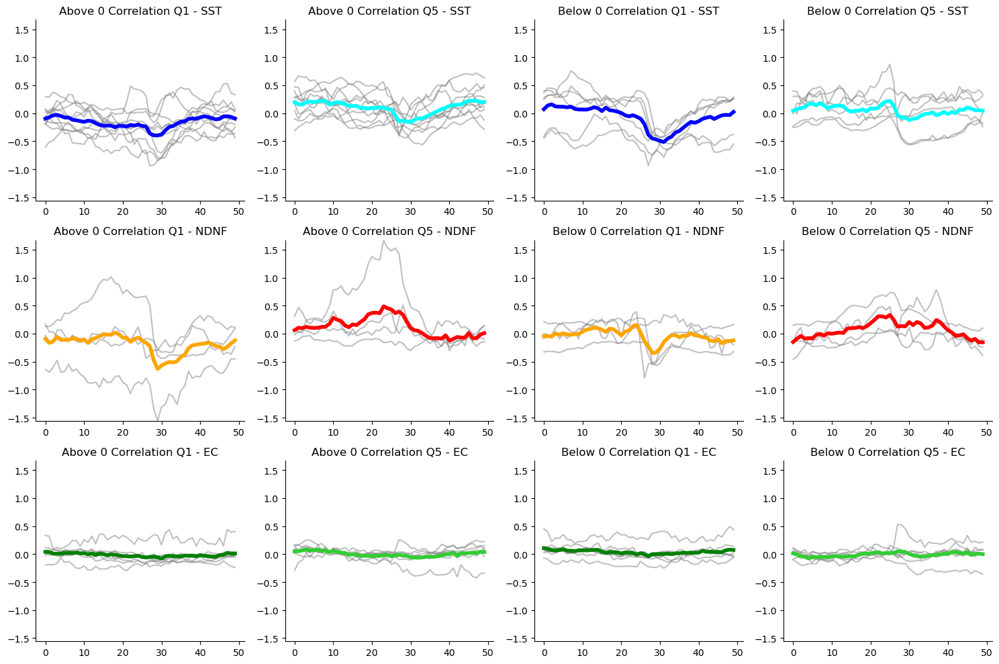

In [159]:


def get_activity_by_animal_quintile_split(activity_SST_above):
    per_animal_activity_SST_above_q1 = []
    per_animal_activity_SST_above_q5 = []

    for animal in activity_SST_above:
        animal_mean_q1 = []
        animal_mean_q5 = []
        
        for neuron in activity_SST_above[animal]:
            sst_quintiles = split_into_quintiles(activity_SST_above[animal][neuron])
            first_quintile = sst_quintiles[0]
            first_quintile_trial_av = np.mean(first_quintile, axis=1)
            animal_mean_q1.append(first_quintile_trial_av)
            last_quintile = sst_quintiles[-1]
            last_quintile_trial_av = np.mean(last_quintile, axis=1)
            animal_mean_q5.append(last_quintile_trial_av)
            
        if not animal_mean_q1: continue
        if not animal_mean_q5: continue
        animal_mean_array_q1 = np.stack(animal_mean_q1)
        animal_mean_array_q5 = np.stack(animal_mean_q5)
        
        per_animal_activity_SST_above_q1.append(np.mean(animal_mean_q1, axis=0))
        per_animal_activity_SST_above_q5.append(np.mean(animal_mean_q5, axis=0))

    return per_animal_activity_SST_above_q1, per_animal_activity_SST_above_q5

def get_animal_vel_correlations_activity_quintiles(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, residual=True, learning=False):

    r2_SST_above_zero, r2_SST_below_zero = get_r2_above_and_below_zero(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, variable_to_correlate="Velocity")
    r2_NDNF_above_zero, r2_NDNF_below_zero = get_r2_above_and_below_zero(activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, variable_to_correlate="Velocity")
    r2_EC_above_zero, r2_EC_below_zero = get_r2_above_and_below_zero(activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, variable_to_correlate="Velocity")
    
    activity_SST_above = filter_activity_by_r2(activity_dict_SST, predicted_activity_dict_SST, r2_SST_above_zero, residual=residual)
    activity_SST_below = filter_activity_by_r2(activity_dict_SST, predicted_activity_dict_SST, r2_SST_below_zero, residual=residual)

    activity_NDNF_above = filter_activity_by_r2(activity_dict_NDNF, predicted_activity_dict_NDNF, r2_NDNF_above_zero, residual=residual)
    activity_NDNF_below = filter_activity_by_r2(activity_dict_NDNF, predicted_activity_dict_NDNF, r2_NDNF_below_zero, residual=residual)
    
    activity_EC_above = filter_activity_by_r2(activity_dict_EC, predicted_activity_dict_EC, r2_EC_above_zero, residual=residual)
    activity_EC_below = filter_activity_by_r2(activity_dict_EC, predicted_activity_dict_EC, r2_EC_below_zero, residual=residual)
    
    if learning:
        per_animal_activity_SST_above_q1, per_animal_activity_SST_above_q5 = get_activity_by_animal_quintile_split(activity_SST_above)
        per_animal_activity_SST_below_q1, per_animal_activity_SST_below_q5 = get_activity_by_animal_quintile_split(activity_SST_below)

        per_animal_activity_NDNF_above_q1, per_animal_activity_NDNF_above_q5 = get_activity_by_animal_quintile_split(activity_NDNF_above)
        per_animal_activity_NDNF_below_q1, per_animal_activity_NDNF_below_q5 = get_activity_by_animal_quintile_split(activity_NDNF_below)

        per_animal_activity_EC_above_q1, per_animal_activity_EC_above_q5 = get_activity_by_animal_quintile_split(activity_EC_above)
        per_animal_activity_EC_below_q1, per_animal_activity_EC_below_q5 = get_activity_by_animal_quintile_split(activity_EC_below)
        
        per_animal_activity_above_list_q1 = [per_animal_activity_SST_above_q1, per_animal_activity_NDNF_above_q1, per_animal_activity_EC_above_q1]
        per_animal_activity_above_list_q5 = [per_animal_activity_SST_above_q5, per_animal_activity_NDNF_above_q5, per_animal_activity_EC_above_q5]
        per_animal_activity_below_list_q1 = [per_animal_activity_SST_below_q1, per_animal_activity_NDNF_below_q1, per_animal_activity_EC_below_q1]
        per_animal_activity_below_list_q5 = [per_animal_activity_SST_below_q5, per_animal_activity_NDNF_below_q5, per_animal_activity_EC_below_q5]
        
        return per_animal_activity_above_list_q1, per_animal_activity_above_list_q5, per_animal_activity_below_list_q1, per_animal_activity_below_list_q5

    else:
        per_animal_activity_SST_above = get_activity_by_animal(activity_SST_above)
        per_animal_activity_SST_below = get_activity_by_animal(activity_SST_below)

        per_animal_activity_NDNF_above = get_activity_by_animal_quintile_split(activity_NDNF_above)
        per_animal_activity_NDNF_below = get_activity_by_animal_quintile_split(activity_NDNF_below)

        per_animal_activity_EC_above = get_activity_by_animal_quintile_split(activity_EC_above)
        per_animal_activity_EC_below = get_activity_by_animal_quintile_split(activity_EC_below)

        return per_animal_activity_SST_above, per_animal_activity_SST_below, per_animal_activity_NDNF_above, per_animal_activity_NDNF_below, per_animal_activity_EC_above, per_animal_activity_EC_below

per_animal_activity_above_list_q1, per_animal_activity_above_list_q5, per_animal_activity_below_list_q1, per_animal_activity_below_list_q5 = get_animal_vel_correlations_activity_quintiles(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, residual=True, learning=True)

labels = ["SST", "NDNF", "EC"]
colors_q1 = ["blue", "orange", "green"]
colors_q5 = ["cyan", "red", "limegreen"]

all_values = []

for activity_list in [per_animal_activity_above_list_q1, per_animal_activity_above_list_q5, per_animal_activity_below_list_q1, per_animal_activity_below_list_q5]:
    for group in activity_list:
        for trace in group:
            all_values.extend(trace)
            
global_min = np.min(all_values)
global_max = np.max(all_values)

fig, axs = plt.subplots(3, 4, figsize=(15, 10))

axs = np.array(axs)

for idx, i in enumerate(per_animal_activity_above_list_q1):
    for j in i: 
        axs[idx, 0].plot(j, color='gray', alpha=0.5)  
    axs[idx, 0].plot(np.mean(np.stack(i), axis=0), color=colors_q1[idx], linewidth=4) 
    axs[idx, 0].set_title(f"Above 0 Correlation Q1 - {labels[idx]}")
    axs[idx, 0].set_ylim(global_min, global_max)

for idx, i in enumerate(per_animal_activity_above_list_q5):
    for j in i: 
        axs[idx, 1].plot(j, color='gray', alpha=0.5)
    axs[idx, 1].plot(np.mean(np.stack(i), axis=0), color=colors_q5[idx], linewidth=4)
    axs[idx, 1].set_title(f"Above 0 Correlation Q5 - {labels[idx]}")
    axs[idx, 1].set_ylim(global_min, global_max)

for idx, i in enumerate(per_animal_activity_below_list_q1):
    for j in i: 
        axs[idx, 2].plot(j, color='gray', alpha=0.5)
    axs[idx, 2].plot(np.mean(np.stack(i), axis=0), color=colors_q1[idx], linewidth=4)
    axs[idx, 2].set_title(f"Below 0 Correlation Q1 - {labels[idx]}")
    axs[idx, 2].set_ylim(global_min, global_max)

for idx, i in enumerate(per_animal_activity_below_list_q5):
    for j in i: 
        axs[idx, 3].plot(j, color='gray', alpha=0.5)
    axs[idx, 3].plot(np.mean(np.stack(i), axis=0), color=colors_q5[idx], linewidth=4)
    axs[idx, 3].set_title(f"Below 0 Correlation Q5 - {labels[idx]}")
    axs[idx, 3].set_ylim(global_min, global_max)

plt.tight_layout()
plt.show()


trial_av_activity_SST_above 58
trial_av_activity_SST_below 17


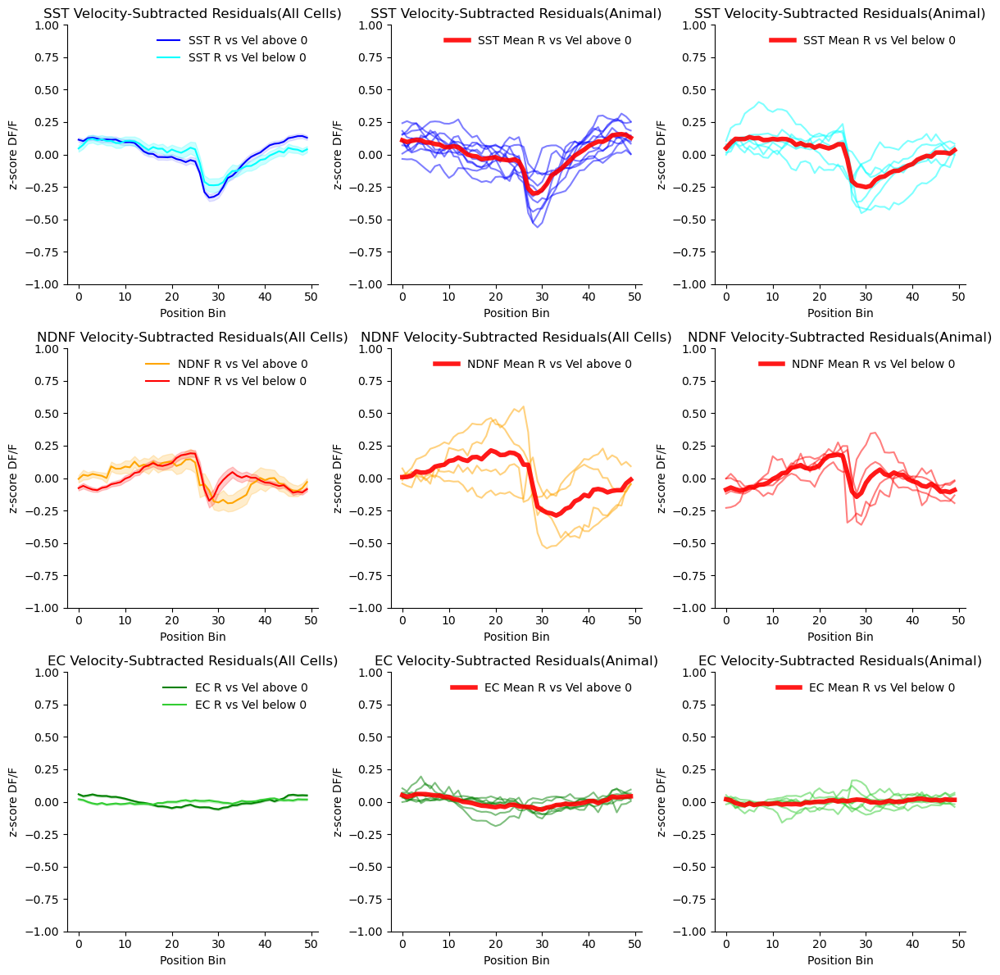

In [28]:

# # # ############# Raw 

# plot_r2_above_below_per_animal(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, residual=False)


############ Residual

plot_r2_above_below_per_animal(activity_dict_SST, predicted_activity_dict_SST, filtered_factors_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, filtered_factors_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, filtered_factors_dict_EC, residual=True)


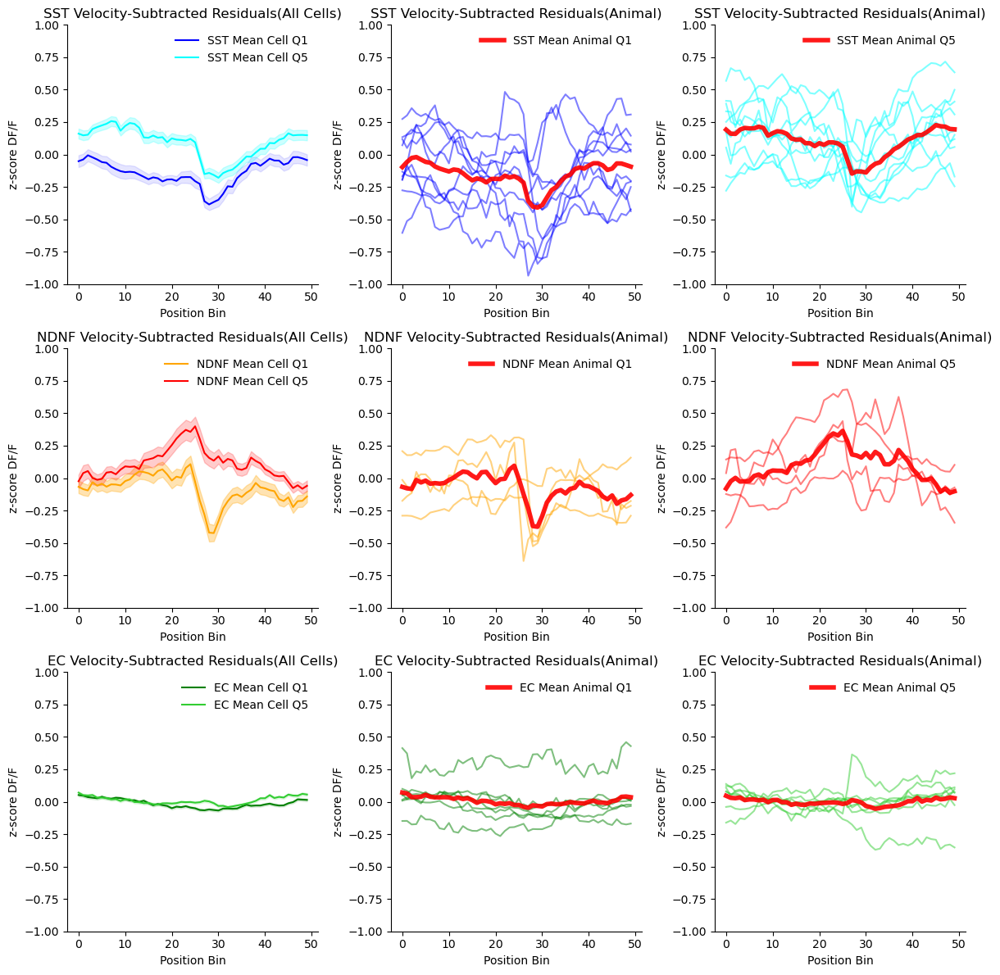

In [23]:
# ## raw

# plot_first_and_last_quintile(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=False)


## residuals

plot_first_and_last_quintile(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, residual=True)



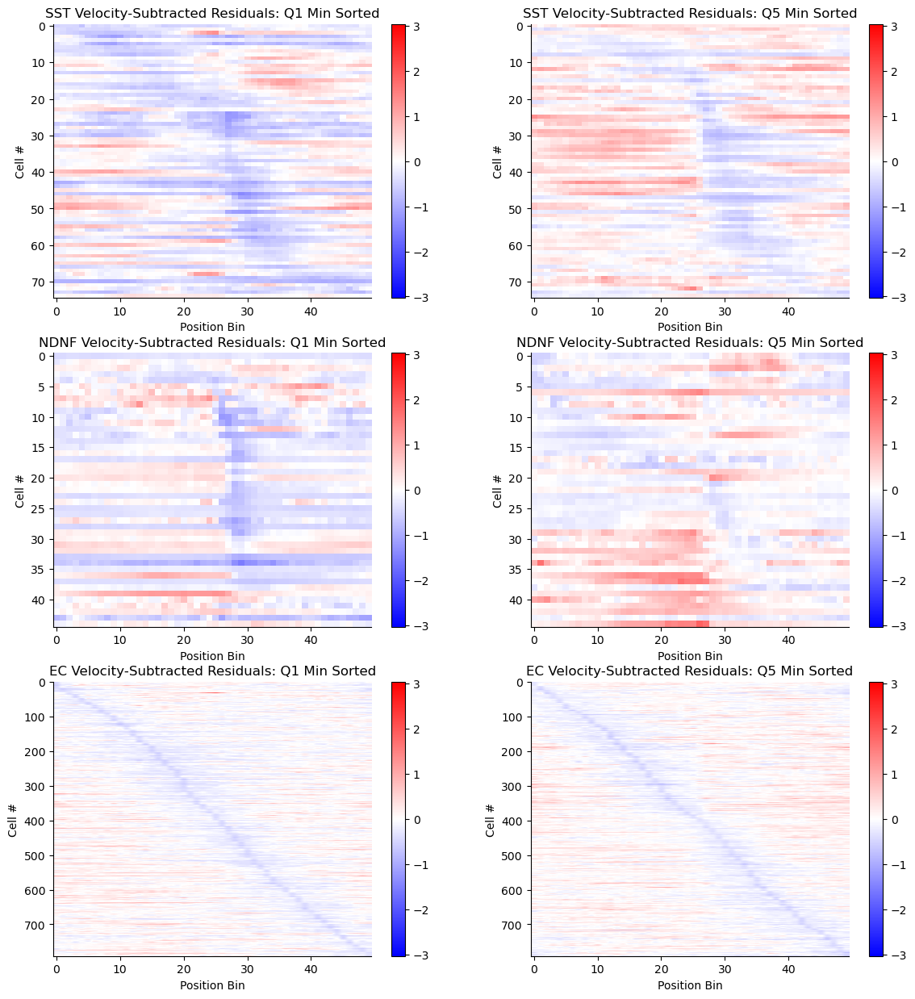

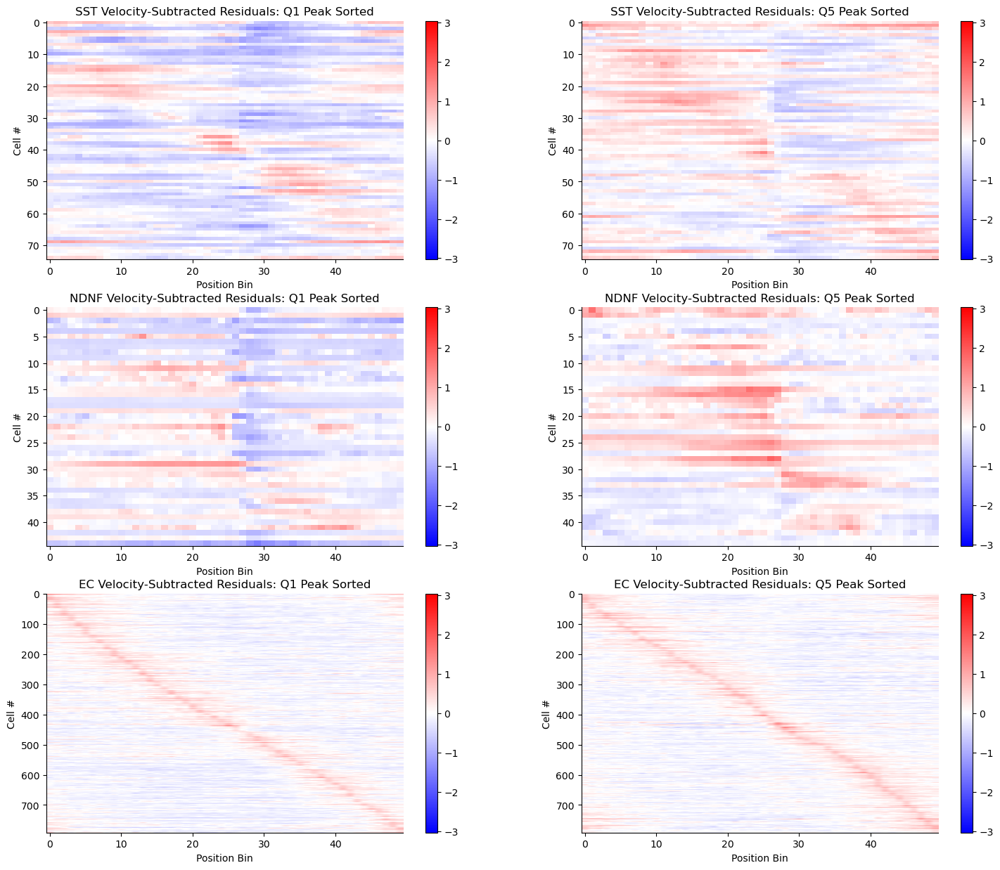

In [24]:

get_learning_heatmaps(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, max_or_min="min")
get_learning_heatmaps(activity_dict_SST, predicted_activity_dict_SST, activity_dict_NDNF, predicted_activity_dict_NDNF, activity_dict_EC, predicted_activity_dict_EC, max_or_min="max")
    

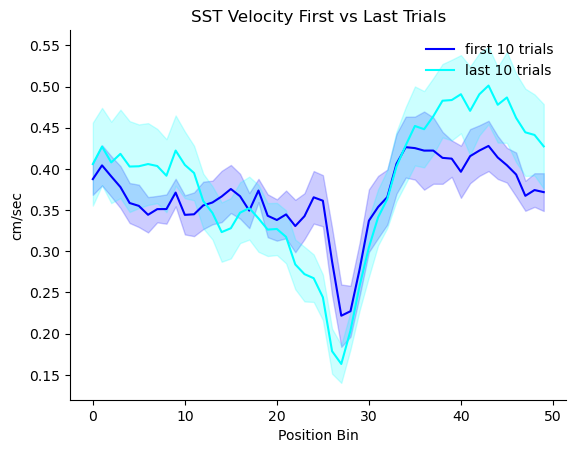

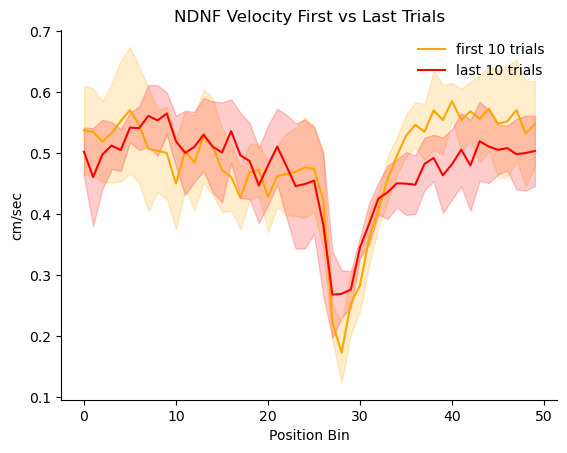

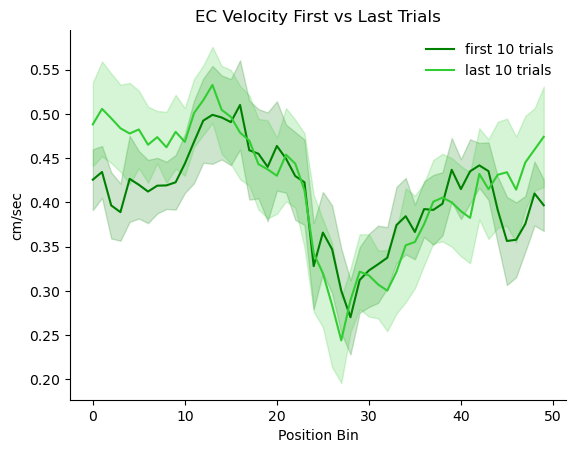

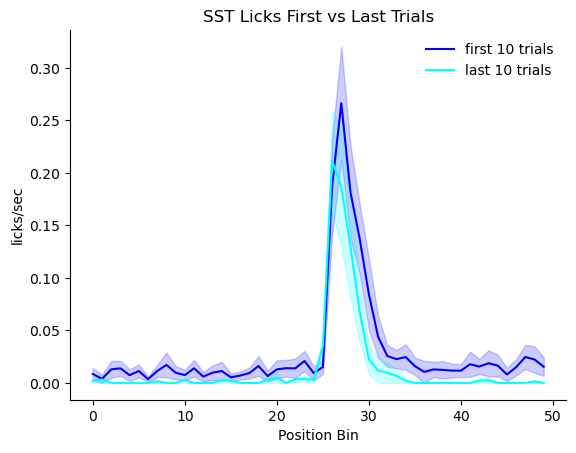

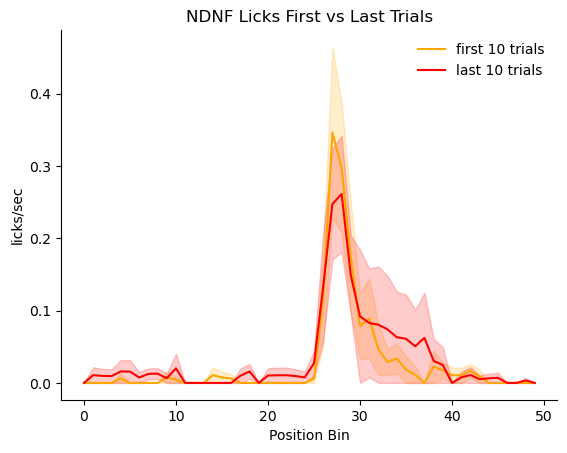

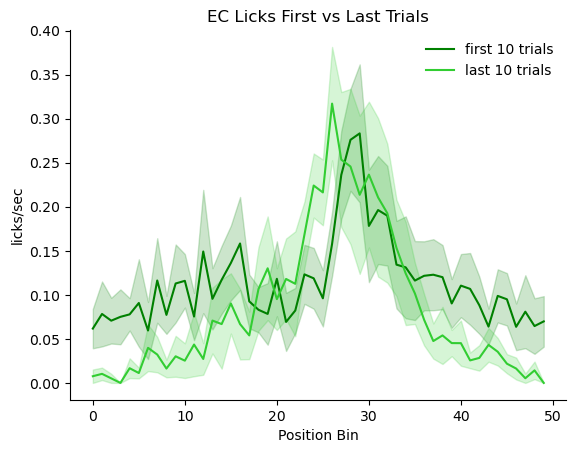

In [25]:

    
plot_first_last_trials_variable_across_animals(factors_dict_SST, variable_of_interest="Velocity", cell_type="SST")
plot_first_last_trials_variable_across_animals(factors_dict_NDNF, variable_of_interest="Velocity", cell_type="NDNF")
plot_first_last_trials_variable_across_animals(factors_dict_EC, variable_of_interest="Velocity", cell_type="EC")

plot_first_last_trials_variable_across_animals(factors_dict_SST, variable_of_interest="Licks", cell_type="SST")
plot_first_last_trials_variable_across_animals(factors_dict_NDNF, variable_of_interest="Licks", cell_type="NDNF")
plot_first_last_trials_variable_across_animals(factors_dict_EC, variable_of_interest="Licks", cell_type="EC")
